# Novel Corona Virus 2019 Dataset
## Day level information on covid-19 affected cases

https://www.kaggle.com/imengharbi/projet-ml2-5e1e65/edit?rvi=1

# Task1:predicting-the-end-of-covid19

Correlation between growth rate and types of mitigation across countries 
Corrélation entre le taux de croissance et les types d'atténuation d'un pays à l'autre

If we need to predict the end of covid-19 in China and the rest of the World (le nombres des cas confirmés doit rester constant pour une grande période de temps ou pour etre plus précis il faut que les cas actives s'annuler), we must know how involve an active confirmed. We know that:

active_confirmed = confirmed - (death + recovered)

 The disease decrease if  (d active_confirmed/dt)<0 ;∀t∈[0,inf[

The goal of this notebook is to find if the growth rate of active confirmed is become negative in china and somewhere in the rest of the world.

In [7]:
#we import all package that we need
import matplotlib.pyplot as plt
import seaborn as sns 
import statsmodels as sm
import folium as fl
from pathlib import Path
from sklearn.impute import SimpleImputer
import plotly.offline as py
import plotly.express as px
import cufflinks as cf
import numpy as np 
import pandas as pd

In [8]:
%matplotlib inline
pd.options.plotting.backend
py.init_notebook_mode(connected=False)
cf.set_config_file(offline=True)
sns.set()
pd.plotting.register_matplotlib_converters

<function pandas.plotting._misc.register()>

In [9]:
covid = pd.read_csv('covid_19_data.csv')

In [5]:
#see data 
covid.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [6]:
covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35202 entries, 0 to 35201
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   SNo              35202 non-null  int64  
 1   ObservationDate  35202 non-null  object 
 2   Province/State   18555 non-null  object 
 3   Country/Region   35202 non-null  object 
 4   Last Update      35202 non-null  object 
 5   Confirmed        35202 non-null  float64
 6   Deaths           35202 non-null  float64
 7   Recovered        35202 non-null  float64
dtypes: float64(3), int64(1), object(4)
memory usage: 2.1+ MB


In [7]:
# check if there exist a missing value
mis = covid.isnull().sum()
mis[mis>0]

Province/State    16647
dtype: int64

Only Province/State have a missing value. I can impute it because this variable is necessary for visualizing a data.

In [8]:
imputer = SimpleImputer(strategy='constant')#here I use constant because I cannot put another Province/State
#that we do not know or that does not correspond to his country/region  
impute_covid = pd.DataFrame(imputer.fit_transform(covid), columns=covid.columns)
impute_covid.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1,0,0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14,0,0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6,0,0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1,0,0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0,0,0


In [9]:
impute_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35202 entries, 0 to 35201
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   SNo              35202 non-null  object
 1   ObservationDate  35202 non-null  object
 2   Province/State   35202 non-null  object
 3   Country/Region   35202 non-null  object
 4   Last Update      35202 non-null  object
 5   Confirmed        35202 non-null  object
 6   Deaths           35202 non-null  object
 7   Recovered        35202 non-null  object
dtypes: object(8)
memory usage: 2.1+ MB


In [10]:
#convert ObservationDate and Last Update object to datetime
#convert confirmed, recovered, death to numeric
impute_covid['ObservationDate'] = pd.to_datetime(impute_covid['ObservationDate'])
impute_covid['Last Update'] = pd.to_datetime(impute_covid['Last Update'])
impute_covid['Confirmed'] = pd.to_numeric(impute_covid['Confirmed'], errors='coerce')
impute_covid['Recovered'] = pd.to_numeric(impute_covid['Recovered'], errors='coerce')
impute_covid['Deaths'] = pd.to_numeric(impute_covid['Deaths'], errors='coerce')

In [11]:
impute_covid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35202 entries, 0 to 35201
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   SNo              35202 non-null  object        
 1   ObservationDate  35202 non-null  datetime64[ns]
 2   Province/State   35202 non-null  object        
 3   Country/Region   35202 non-null  object        
 4   Last Update      35202 non-null  datetime64[ns]
 5   Confirmed        35202 non-null  float64       
 6   Deaths           35202 non-null  float64       
 7   Recovered        35202 non-null  float64       
dtypes: datetime64[ns](2), float64(3), object(3)
memory usage: 2.1+ MB


### Some relevant Information and Visualization

In [12]:
impute_covid.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,2020-01-22,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
1,2,2020-01-22,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0
2,3,2020-01-22,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0
3,4,2020-01-22,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
4,5,2020-01-22,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0


In [13]:
#On ajoute la colonne 'active_confirmed'
# we compute the active_confirmed
impute_covid['active_confirmed'] = impute_covid['Confirmed'].values - \
(impute_covid['Deaths'].values+impute_covid['Recovered'].values)

In [14]:
#check if all is ok
impute_covid.isnull().sum()

SNo                 0
ObservationDate     0
Province/State      0
Country/Region      0
Last Update         0
Confirmed           0
Deaths              0
Recovered           0
active_confirmed    0
dtype: int64

ok we have no problem

In [226]:
impute_covid.corr()

,Confirmed,Deaths,Recovered,active_confirmed
Confirmed,1.000000,0.854979,0.413478,0.800541
Deaths,0.854979,1.000000,0.308505,0.685623
Recovered,0.413478,0.308505,1.000000,-0.212353
active_confirmed,0.800541,0.685623,-0.212353,1.000000


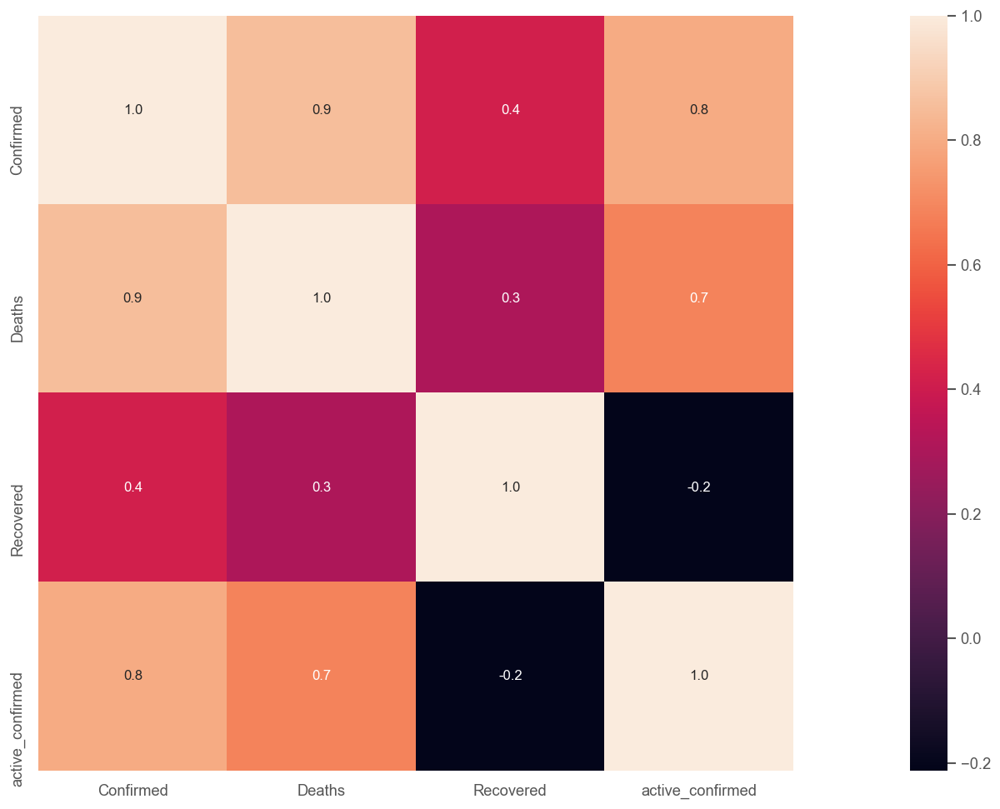

In [227]:
#Matrice de corrélation
corr = impute_covid.iloc[:,1:].corr()
plt.subplots(figsize=(30,10))
sns.heatmap( corr, square=True, annot=True, fmt=".1f" ) 

### The Worldwide confirmed, recovered, death and active confirmed

In [15]:
# Repérer la plus ancienne date et la plus récente date
start_date = impute_covid.ObservationDate.min()
end_date = impute_covid.ObservationDate.max()
print('Novel Covid-19 information:\n 1. Start date = {}\n 2. End date = {}'.format(start_date, end_date))

Novel Covid-19 information:
 1. Start date = 2020-01-22 00:00:00
 2. End date = 2020-06-04 00:00:00


In [16]:
#Obtenir les données les plus récentes
worldwide = impute_covid[impute_covid['ObservationDate'] == end_date]

On a 190 pays 

In [19]:
worldwide

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,active_confirmed
34538,34539,2020-06-04,missing_value,Afghanistan,2020-06-05 02:33:06,18054.0,300.0,1585.0,16169.0
34539,34540,2020-06-04,missing_value,Albania,2020-06-05 02:33:06,1197.0,33.0,898.0,266.0
34540,34541,2020-06-04,missing_value,Algeria,2020-06-05 02:33:06,9831.0,681.0,6297.0,2853.0
34541,34542,2020-06-04,missing_value,Andorra,2020-06-05 02:33:06,852.0,51.0,738.0,63.0
34542,34543,2020-06-04,missing_value,Angola,2020-06-05 02:33:06,86.0,4.0,18.0,64.0
...,...,...,...,...,...,...,...,...,...
35197,35198,2020-06-04,Zacatecas,Mexico,2020-06-05 02:33:06,341.0,41.0,219.0,81.0
35198,35199,2020-06-04,Zakarpattia Oblast,Ukraine,2020-06-05 02:33:06,1257.0,28.0,524.0,705.0
35199,35200,2020-06-04,Zaporizhia Oblast,Ukraine,2020-06-05 02:33:06,469.0,14.0,269.0,186.0
35200,35201,2020-06-04,Zhejiang,Mainland China,2020-06-05 02:33:06,1268.0,1.0,1267.0,0.0


In [20]:
print('================ Worldwide report ===============================')
print('== Information to {} on novel COVID-19 =========\n'.format(end_date))
print('Tota confirmed: {}\nTotal Deaths: {}\nTotal Recovered: {}\nTotal active confirmed: {}\n\
Total country Recorded: {} \n'.format(\
worldwide.Confirmed.sum(), worldwide.Deaths.sum(), worldwide.Recovered.sum(), worldwide.active_confirmed.sum(),\
                                     nb_country))
print('==================================================================')

================ Worldwide report ===============================
== Information to 2020-06-04 00:00:00 on novel COVID-19 =========

Tota confirmed: 6632985.0
Total Deaths: 391136.0
Total Recovered: 2869963.0
Total active confirmed: 3371886.0
Total country Recorded: 190 



In [17]:
#Nombre de pays et nombre de régions par pays
nb_country = len(worldwide['Country/Region'].value_counts()) # number country
worldwide['Country/Region'].value_counts()

Russia       83
US           58
Japan        48
Colombia     33
Mexico       32
             ..
Benin         1
Argentina     1
Bahrain       1
Romania       1
Macau         1
Name: Country/Region, Length: 190, dtype: int64

In [25]:
# Regrouper les données par pays
world = worldwide.groupby('Country/Region').sum()
# Trier les résultats: du pays le plus affecté vers le pays le moins affecté
world = world.sort_values(by=['Confirmed'], ascending=False)
world.style.background_gradient(cmap='viridis')

,Confirmed,Deaths,Recovered,active_confirmed
Country/Region,,,,
US,1872660.000000,108211.000000,485002.000000,1279447.000000
Brazil,614941.000000,34021.000000,254963.000000,325957.000000
Russia,440538.000000,5376.000000,204197.000000,230965.000000
UK,283079.000000,39987.000000,1219.000000,241873.000000
Spain,240660.000000,27133.000000,150376.000000,63151.000000
Italy,234013.000000,33689.000000,161895.000000,38429.000000
India,226713.000000,6363.000000,108450.000000,111900.000000
France,189569.000000,29068.000000,70094.000000,90407.000000
Germany,184472.000000,8635.000000,167909.000000,7928.000000


Text(0, 0.5, 'Total Cases')

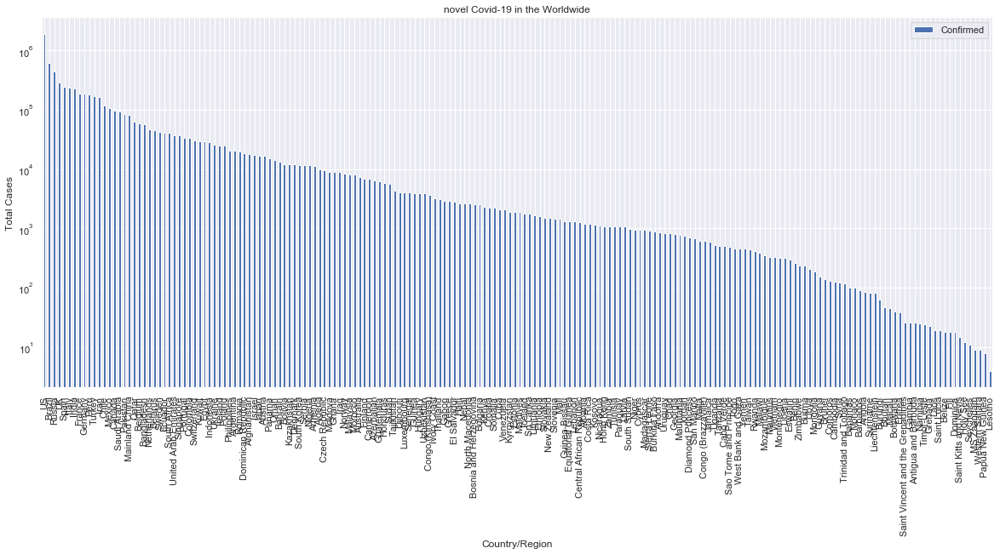

In [26]:
world.Confirmed.plot(kind='bar', title= 'novel Covid-19 in the Worldwide', figsize=(20,8), logy=True,legend=True)
plt.ylabel('Total Cases')

Text(0, 0.5, 'Total Recovered')

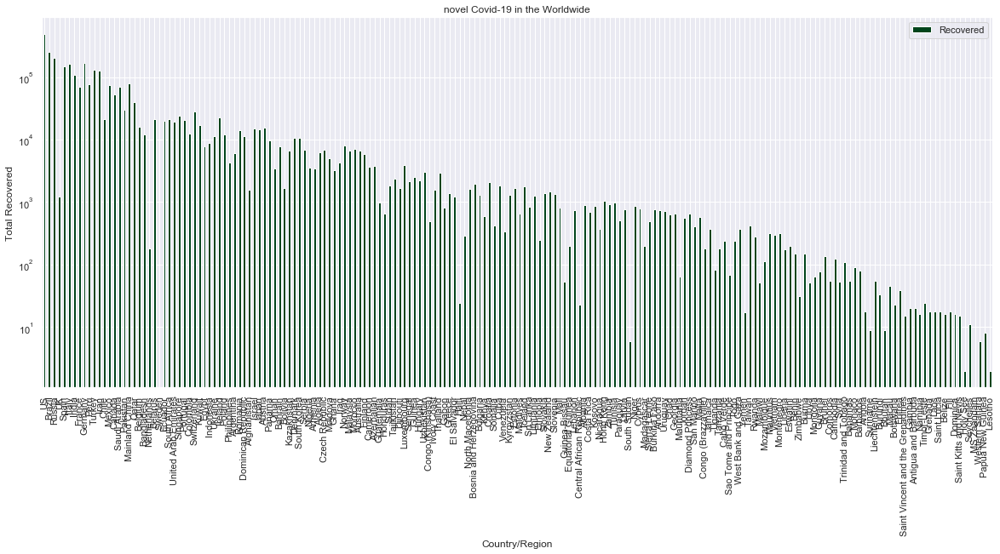

In [27]:
world.Recovered.plot(kind='bar', title= 'novel Covid-19 in the Worldwide', figsize=(20,8), logy=True,\
                    colormap='Greens_r', legend=True)
plt.ylabel('Total Recovered')

Text(0, 0.5, 'Total Deaths')

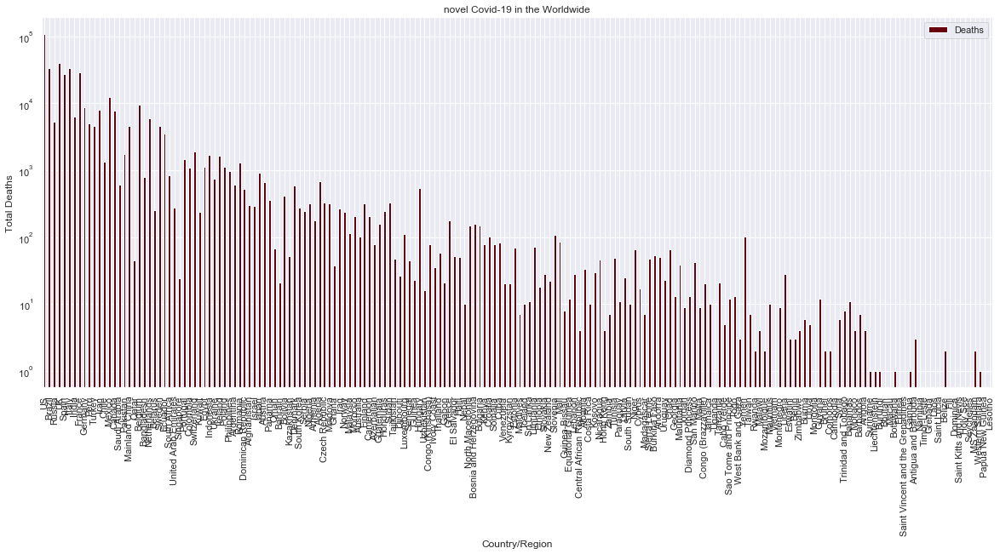

In [28]:
world.Deaths.plot(kind='bar', title= 'novel Covid-19 in the Worldwide', figsize=(20,8), logy=True,\
                     colormap='Reds_r', legend=True)
plt.ylabel('Total Deaths')

Text(0, 0.5, 'Total  Active Cases')

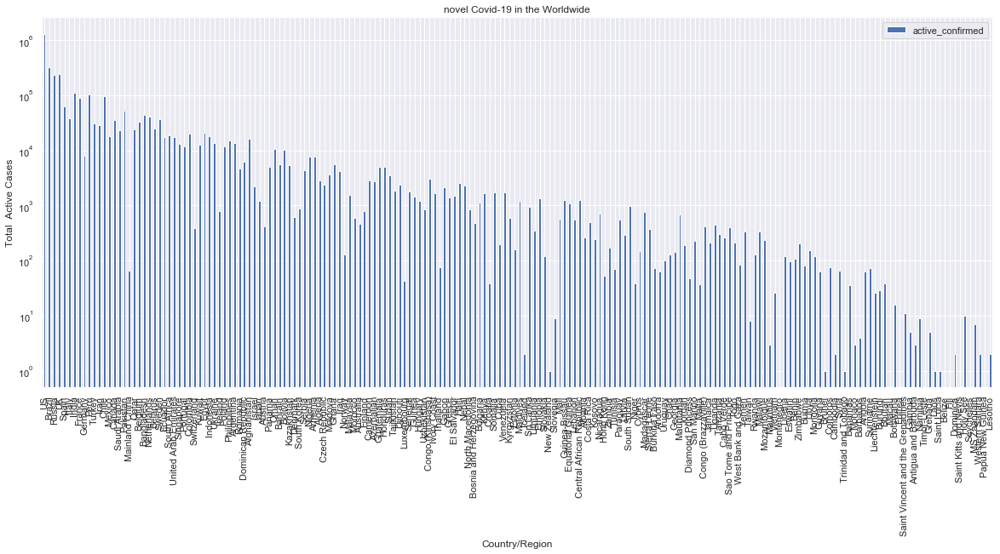

In [29]:
world.active_confirmed.plot(kind='bar', title= 'novel Covid-19 in the Worldwide', figsize=(20,8), logy=True,\
                           legend=True)
plt.ylabel('Total  Active Cases')

### Can we find the model that explain well the covid 19 disease control ?

# ARIMA

In [78]:
df = pd.read_csv('covid_19_data.csv')
df = df.sort_values(by='ObservationDate', ascending=False)

In [79]:
#Province and State Wise Time Series Analysis
dfc = df[['ObservationDate', 'Confirmed']]
dfc['Date'] = dfc['ObservationDate']
dfc['Date'] = dfc['Date'].astype('datetime64')
cases = dfc.set_index('Date')
cases.index

DatetimeIndex(['2020-06-04', '2020-06-04', '2020-06-04', '2020-06-04',
               '2020-06-04', '2020-06-04', '2020-06-04', '2020-06-04',
               '2020-06-04', '2020-06-04',
               ...
               '2020-01-22', '2020-01-22', '2020-01-22', '2020-01-22',
               '2020-01-22', '2020-01-22', '2020-01-22', '2020-01-22',
               '2020-01-22', '2020-01-22'],
              dtype='datetime64[ns]', name='Date', length=35202, freq=None)

Notre base de données est jusqu'à 04/06/2020

In [80]:
# Collécter les données par jour
y = cases['Confirmed'].resample('D').mean()
y

Date
2020-01-22       14.605263
2020-01-23       14.195652
2020-01-24       22.951220
2020-01-25       32.681818
2020-01-26       45.063830
                  ...     
2020-05-31    11111.614414
2020-06-01     9436.524096
2020-06-02     9620.268477
2020-06-03     9802.161145
2020-06-04     9989.435241
Freq: D, Name: Confirmed, Length: 135, dtype: float64

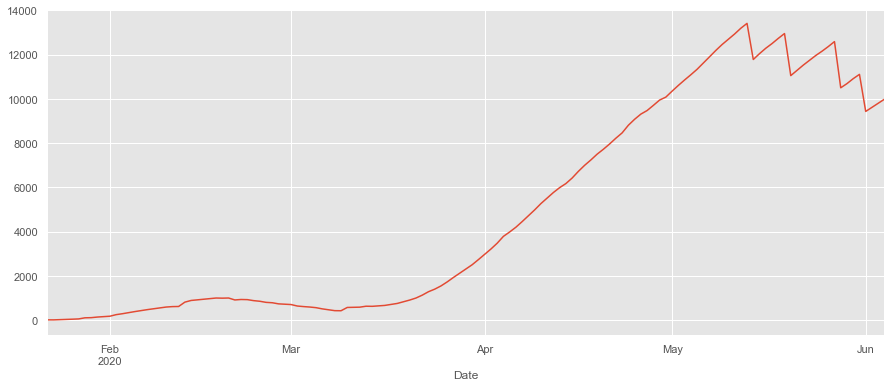

In [81]:
plt.style.use('ggplot')
import warnings
import itertools
y.plot(figsize=(15, 6))# confirmed cases en fonction du temps
plt.show()

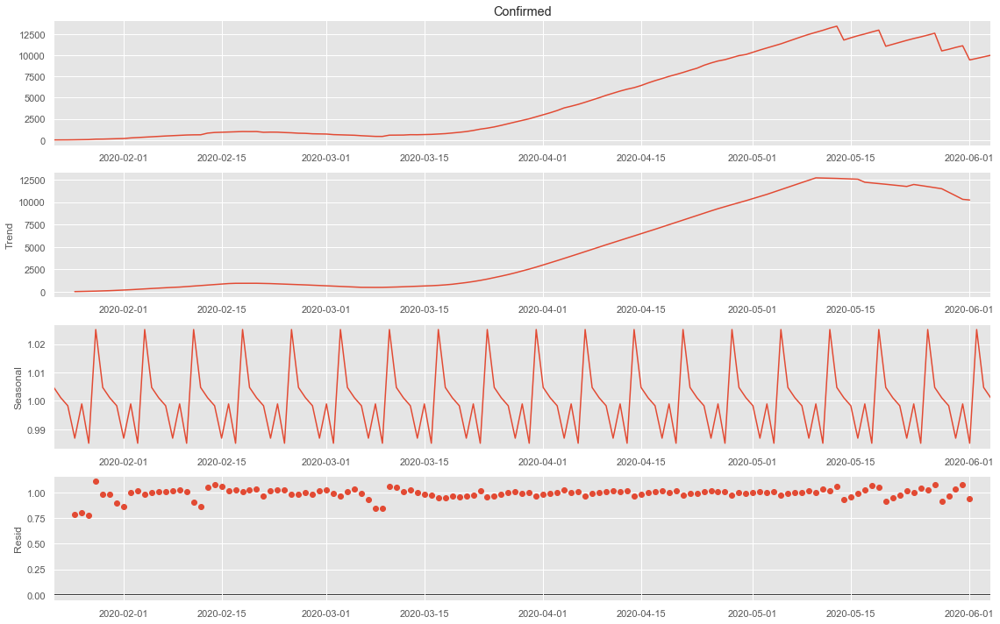

In [68]:
from pylab import rcParams
import statsmodels.api as sm
rcParams['figure.figsize'] = 16, 10
decomposition = sm.tsa.seasonal_decompose(y, model='multiplicative')
fig = decomposition.plot()
plt.show()

Let's check the stationarity of the time series

In [82]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(y)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -2.424848
p-value: 0.134846


In [83]:
type(y)
d = pd.DataFrame(y)
d = d.reset_index()

p value is greater than 0.05 and it proves the null hypothesis right that is the time series is not stationary. So, let's plot the differencing ACF to find the order which makes the series stationary.

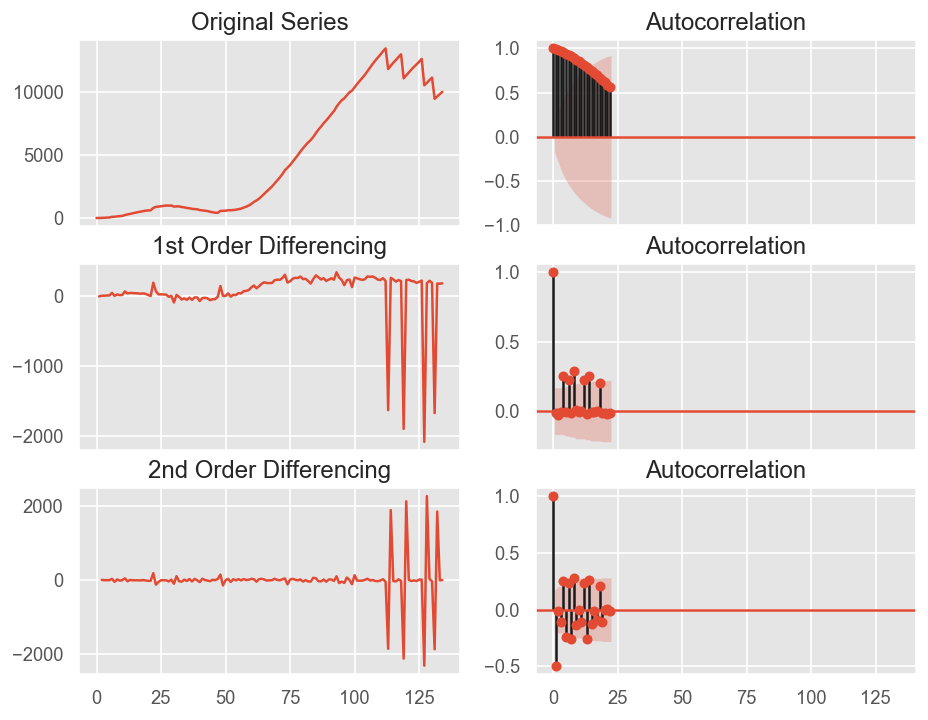

In [84]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(d.Confirmed); axes[0, 0].set_title('Original Series')
plot_acf(y, ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(d.Confirmed.diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(d.Confirmed.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(d.Confirmed.diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(d.Confirmed.diff().diff().dropna(), ax=axes[2, 1])

plt.show()

From the plots, it is quite visible that a first order differencing is fairly enough to make the series stationary but the stationarity would be weak because the 2nd order differecing is making the series rather revolve around a certain constant mean than the first oder differencing is doing. Therefore, I would take d = 2

Let's draw PACF plot to find p for the ARIMA model we are going to implement on the time series

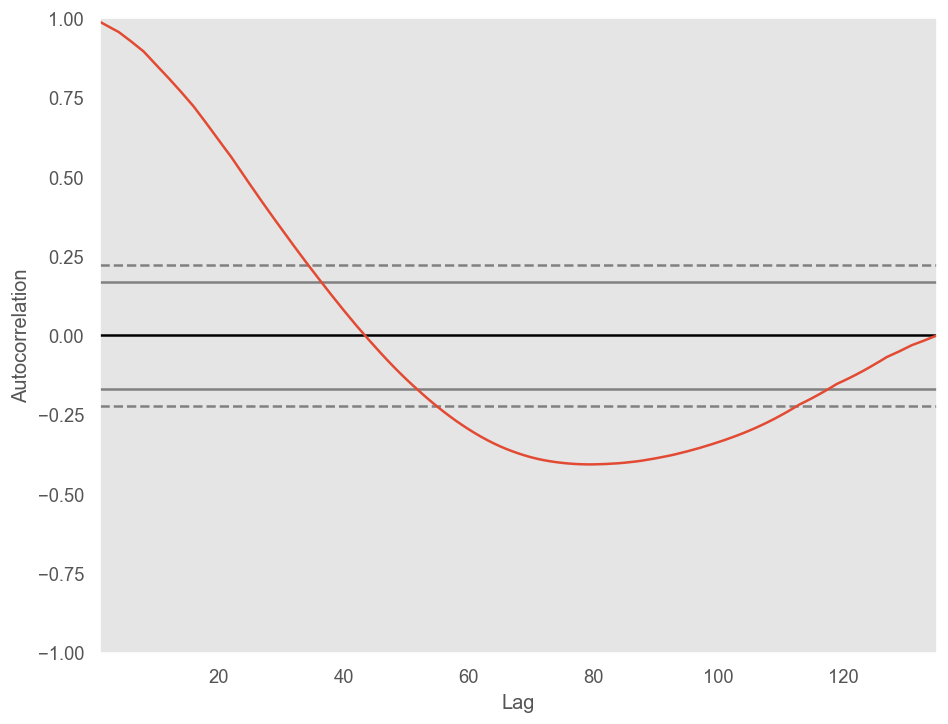

In [85]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(y)

A good starting point for the AR parameter of the model may be 4.

Let's see the MA for this model by plotting ACF

From the first and second differencing plots, we got the ACF plots. Although, I could take q = 2 since it corresponds to the ACF plots to the second differencing, I would be skeptical about the negative lag since it reaches too quickly and stick to q = 1.

In [86]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(y, order=(4,2,1))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:           D2.Confirmed   No. Observations:                  133
Model:                 ARIMA(4, 2, 1)   Log Likelihood                -961.660
Method:                       css-mle   S.D. of innovations            331.171
Date:                Sun, 07 Jun 2020   AIC                           1937.320
Time:                        22:25:36   BIC                           1957.553
Sample:                    01-24-2020   HQIC                          1945.542
                         - 06-04-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -1.6751      2.986     -0.561      0.575      -7.528       4.178
ar.L1.D2.Confirmed    -0.2630      0.104     -2.517      0.012      -0.468      -0.058
ar.L2.D2.Confirmed  

In [87]:
from statsmodels.tsa.arima_model import ARIMA
model = ARIMA(y, order=(3,2,1))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:           D2.Confirmed   No. Observations:                  133
Model:                 ARIMA(3, 2, 1)   Log Likelihood                -961.887
Method:                       css-mle   S.D. of innovations            331.717
Date:                Sun, 07 Jun 2020   AIC                           1935.775
Time:                        22:26:46   BIC                           1953.117
Sample:                    01-24-2020   HQIC                          1942.822
                         - 06-04-2020                                         
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -1.6965      2.999     -0.566      0.572      -7.575       4.182
ar.L1.D2.Confirmed    -0.2932      0.095     -3.100      0.002      -0.479      -0.108
ar.L2.D2.Confirmed  

After couple of fine tuning, ARIMA(3,2,1) model looks nice since all the coefficients corresponds to p-value less than 0.05 and thus is significant. Let's plot residuals to see if they have any patterns.

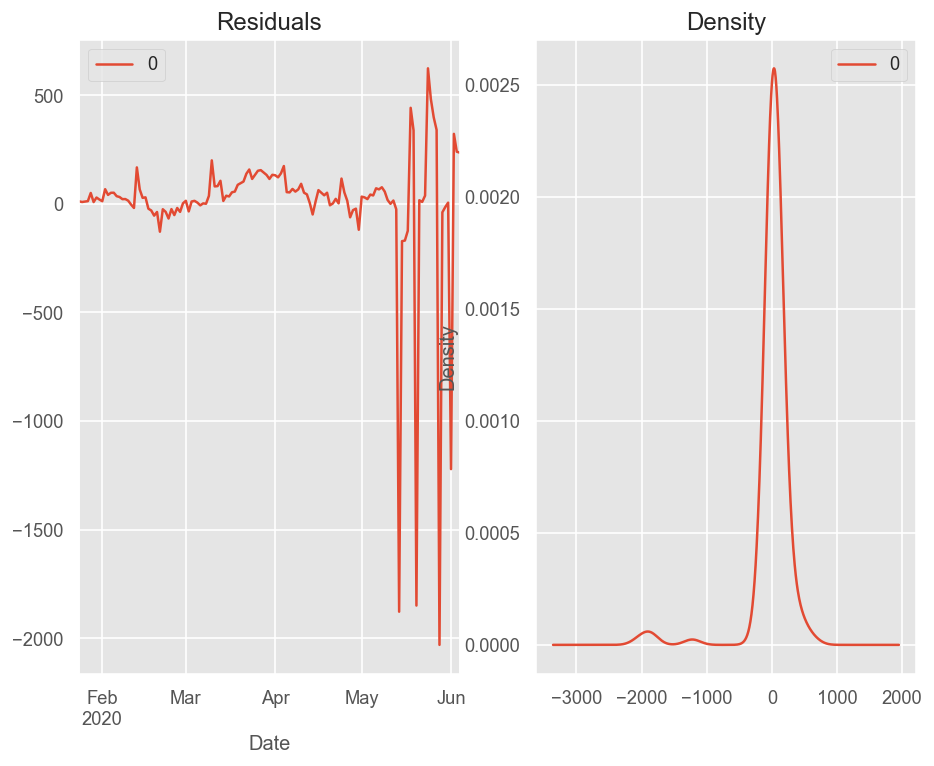

In [89]:
# Plot residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

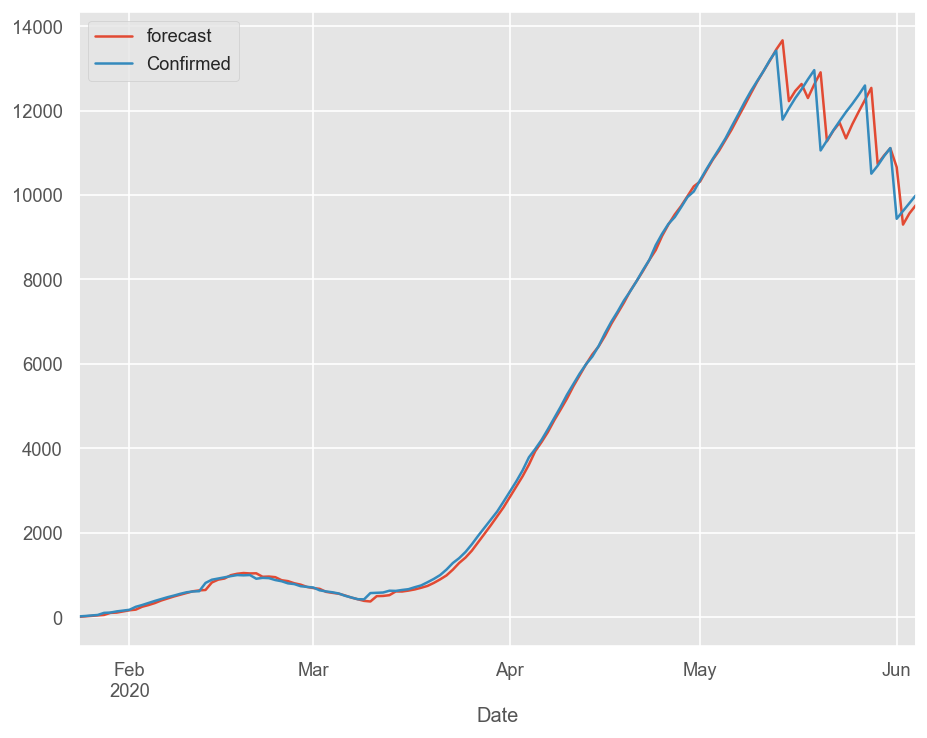

In [90]:
model_fit.plot_predict(dynamic=False)
plt.show()

Let's focus to forecasting into the future.

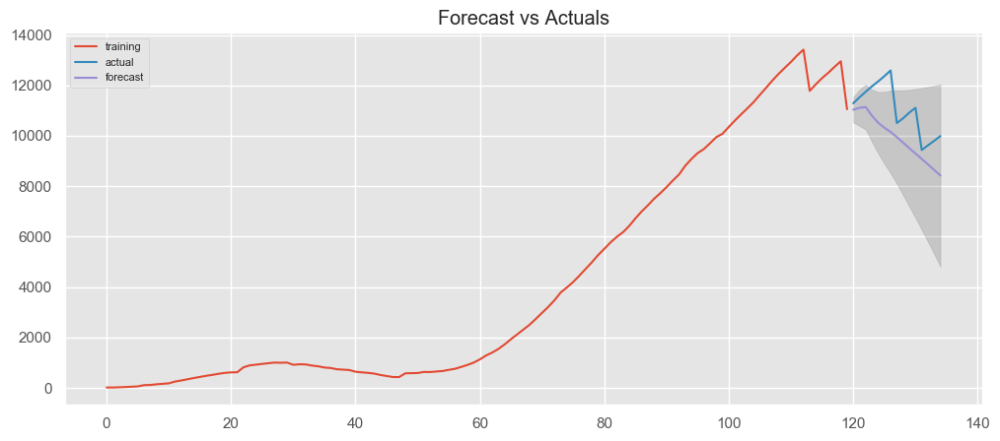

In [91]:
from statsmodels.tsa.stattools import acf

# Create Training and Test
train = d.Confirmed[:120]
test = d.Confirmed[120:]

model = ARIMA(train, order=(3, 2, 1))  
fitted = model.fit(disp=-1)  

# Forecast
fc, se, conf = fitted.forecast(15, alpha=0.05)  # 95% conf
# Make as pandas series
fc_series = pd.Series(fc, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

# Plot
plt.figure(figsize=(12,5), dpi=100)
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(fc_series, label='forecast')
plt.fill_between(lower_series.index, lower_series, upper_series, 
                 color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
plt.show()

In [92]:
#Prediction 
forecasts = (fitted.forecast(steps=7)[0])

In [93]:
#plot the predictions
dates = d['Date'].tolist()+['2020-05-05','2020-05-06','2020-05-07','2020-05-08','2020-05-09','2020-05-10','2020-05-11']
count = d['Confirmed'].tolist()+forecasts.tolist()

In [94]:
final_forecast = pd.DataFrame({'Date': dates,
                             'Confirmed': count
                              })

In [95]:
final_forecast.Date

0     2020-01-22
1     2020-01-23
2     2020-01-24
3     2020-01-25
4     2020-01-26
         ...    
137   2020-05-07
138   2020-05-08
139   2020-05-09
140   2020-05-10
141   2020-05-11
Name: Date, Length: 142, dtype: datetime64[ns]

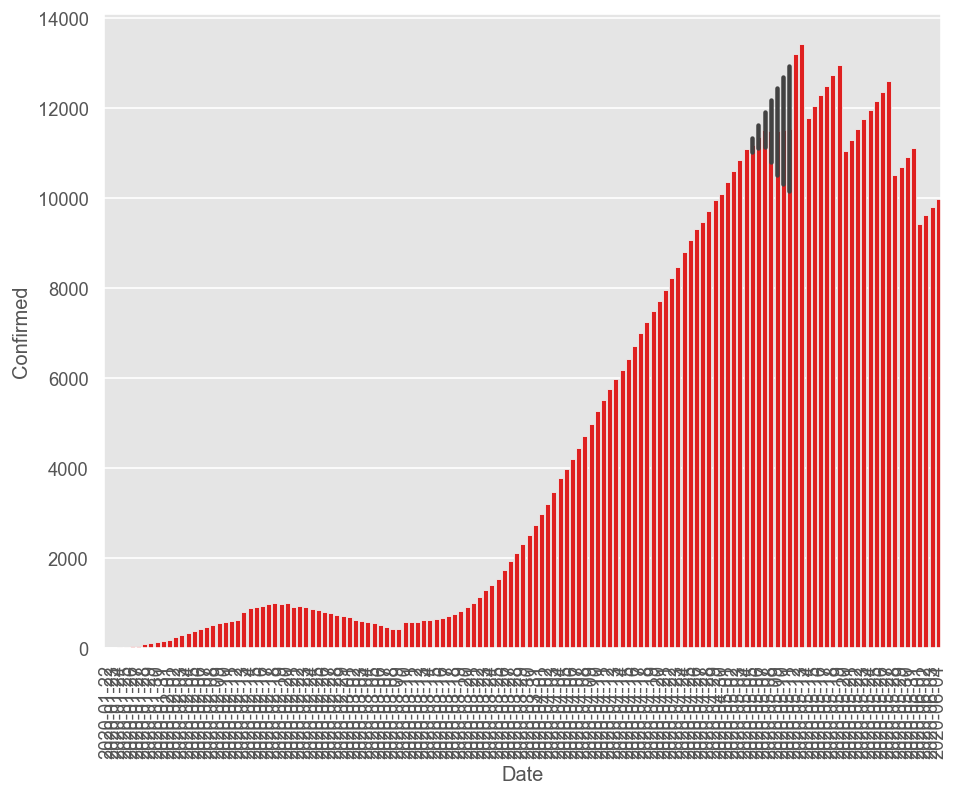

In [96]:
import seaborn as sns
final_forecast['Date'] = final_forecast['Date'].astype('datetime64')
final_forecast['Date'] = final_forecast['Date'].dt.date
final_forecast['Date']
clrs = []
clrs = ['red' for x in final_forecast['Date'].tolist()]
    # if x in ['2020-05-05','2020-05-06','2020-05-07','2020-05-08','2020-05-09','2020-05-10','2020-05-11']
       

ax = sns.barplot(x='Date', y= 'Confirmed', data=final_forecast, palette=clrs)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

# SVR regressor

In [10]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from statsmodels.tsa.api import Holt,SimpleExpSmoothing,ExponentialSmoothing
from sklearn.metrics import mean_squared_error,r2_score
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import timedelta
from statsmodels.tsa.api import Holt,SimpleExpSmoothing,ExponentialSmoothing

In [11]:
model_scores=[]

In [12]:
covid=pd.read_csv("covid_19_data.csv")

In [13]:
covid["ObservationDate"]=pd.to_datetime(covid["ObservationDate"])

In [14]:
covid=covid.drop(columns=['SNo'])

In [15]:
covid=covid.drop(columns=['Province/State'])

In [16]:
covid_datewise=covid.groupby(["ObservationDate"]).agg({"Confirmed":'sum',"Recovered":'sum',"Deaths":'sum'})
covid_datewise.head(2)

,Confirmed,Recovered,Deaths
ObservationDate,,,
2020-01-22,555.0,28.0,17.0
2020-01-23,653.0,30.0,18.0


In [17]:
covid_datewise.index[0]

Timestamp('2020-01-22 00:00:00')

In [18]:
covid_datewise["Days Since"]=(covid_datewise.index-covid_datewise.index[0])
covid_datewise["Days Since"]=covid_datewise["Days Since"].dt.days
covid_datewise.head(2)

,Confirmed,Recovered,Deaths,Days Since
ObservationDate,,,,
2020-01-22,555.0,28.0,17.0,0
2020-01-23,653.0,30.0,18.0,1


In [19]:
regressor_train=covid_datewise.iloc[:int(covid_datewise.shape[0]*0.95)]
valid_ml=covid_datewise.iloc[int(covid_datewise.shape[0]*0.95):]
y_pred=valid_ml.copy()

In [20]:
regressor_train

,Confirmed,Recovered,Deaths,Days Since
ObservationDate,,,,
2020-01-22,555.0,28.0,17.0,0
2020-01-23,653.0,30.0,18.0,1
2020-01-24,941.0,36.0,26.0,2
2020-01-25,1438.0,39.0,42.0,3
2020-01-26,2118.0,52.0,56.0,4
...,...,...,...,...
2020-05-24,5407613.0,2168563.0,345059.0,123
2020-05-25,5495061.0,2231738.0,346232.0,124
2020-05-26,5589626.0,2286956.0,350453.0,125


In [21]:
from sklearn.svm import SVR

In [22]:
regressor=SVR(C=0.01,degree=6,kernel='poly')

In [23]:
regressor.fit(np.array(regressor_train["Days Since"]).reshape(-1,1),regressor_train["Confirmed"])

SVR(C=0.01, cache_size=200, coef0=0.0, degree=6, epsilon=0.1, gamma='scale',
    kernel='poly', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [24]:
prediction_regressor=regressor.predict(np.array(valid_ml["Days Since"]).reshape(-1,1))
rmse_svm=np.sqrt(mean_squared_error(prediction_regressor,valid_ml["Confirmed"]))
model_scores.append(rmse_svm)
print("Root Mean Square Error for SVR Model: ",rmse_svm)

Root Mean Square Error for SVR Model:  5185318.089279236


In [25]:
new_date=[]
new_prediction_regressor=[]
for i in range(1,30):
    new_date.append(covid_datewise.index[-1]+timedelta(days=i))
    new_prediction_regressor.append(round(regressor.predict(np.array(covid_datewise["Days Since"].max()+i).reshape(-1,1))[0]))

In [26]:
model_predictions=pd.DataFrame(zip(new_date,new_prediction_regressor),columns=["Date","SVR Prediction"])
model_predictions

,Date,SVR Prediction
0,2020-06-05,1211072.0
1,2020-06-06,1243683.0
2,2020-06-07,1277516.0
3,2020-06-08,1312606.0
4,2020-06-09,1348991.0
5,2020-06-10,1386709.0
6,2020-06-11,1425798.0
7,2020-06-12,1466298.0
8,2020-06-13,1508249.0
9,2020-06-14,1551693.0


In [27]:
import plotly.offline as pyo
import plotly.graph_objs as go

In [28]:
pip install Pyo

Note: you may need to restart the kernel to use updated packages.


In [29]:
pyo.init_notebook_mode()

In [30]:
plt.figure(figsize=(11,6))
predictions=regressor.predict(np.array(covid_datewise["Days Since"]).reshape(-1,1))
fig=go.Figure()
fig.add_trace(go.Scatter(x=covid_datewise.index, y=covid_datewise["Confirmed"],
                    mode='lines+markers',name="Train Data for Confirmed Cases"))
fig.add_trace(go.Scatter(x=covid_datewise.index, y=predictions,
                    mode='lines',name="Support Vector Machine Best fit Kernel",
                    line=dict(color='black', dash='dot')))
fig.update_layout(title="Confirmed Cases Support Vectore Machine Regressor Prediction",
                 xaxis_title="Date",yaxis_title="Confirmed Cases",legend=dict(x=0,y=1,traceorder="normal"))
fig.show()

<Figure size 792x432 with 0 Axes>

# Regression polynomiale

In [118]:
train_ml=covid_datewise.iloc[:int(covid_datewise.shape[0]*0.95)]
valid_ml=covid_datewise.iloc[int(covid_datewise.shape[0]*0.95):]
model_scores=[]

In [119]:
poly = PolynomialFeatures(degree = 5) 

In [120]:
train_poly=poly.fit_transform(np.array(train_ml["Days Since"]).reshape(-1,1))
valid_poly=poly.fit_transform(np.array(valid_ml["Days Since"]).reshape(-1,1))
y=train_ml["Confirmed"]

In [121]:
linreg=LinearRegression(normalize=True)
linreg.fit(train_poly,y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)

In [122]:
prediction_poly=linreg.predict(valid_poly)
rmse_poly=np.sqrt(mean_squared_error(valid_ml["Confirmed"],prediction_poly))
model_scores.append(rmse_poly)
print("Root Mean Squared Error for Polynomial Regression: ",rmse_poly) 

Root Mean Squared Error for Polynomial Regression:  226804.7758977837


In [ ]:
comp_data=poly.fit_transform(np.array(covid_datewise["Days Since"]).reshape(-1,1))
plt.figure(figsize=(11,6))
predictions_poly=linreg.predict(comp_data)
fig=go.Figure()
fig.add_trace(go.Scatter(x=covid_datewise.index, y=covid_datewise["Confirmed"],
                    mode='lines+markers',name="Train Data for Confirmed Cases"))
fig.add_trace(go.Scatter(x=covid_datewise.index, y=predictions_poly,
                    mode='lines',name="Polynomial Regression Best Fit",
                    line=dict(color='black', dash='dot')))
fig.update_layout(title="Confirmed Cases Polynomial Regression Prediction",
                 xaxis_title="Date",yaxis_title="Confirmed Cases",
                 legend=dict(x=0,y=1,traceorder="normal"))
fig.show()

In [123]:
new_date=[]
new_prediction_poly=[]
for i in range(1,18):
    new_date.append(covid_datewise.index[-1]+timedelta(days=i))
    new_date_poly=poly.fit_transform(np.array(covid_datewise["Days Since"].max()+i).reshape(-1,1))
    new_prediction_poly.append(linreg.predict(new_date_poly)[0])

In [124]:
model_predictions=pd.DataFrame(zip(new_date,new_prediction_poly),columns=["Date","Polynomial Regression Prediction"])
model_predictions.head()

,Date,Polynomial Regression Prediction
0,2020-06-05,6.399444e+06
1,2020-06-06,6.485272e+06
2,2020-06-07,6.571439e+06
3,2020-06-08,6.658021e+06
4,2020-06-09,6.745095e+06


# Holt's Linear Model

In [204]:
model_train=covid_datewise.iloc[:int(covid_datewise.shape[0]*0.95)]
valid=covid_datewise.iloc[int(covid_datewise.shape[0]*0.95):]
y_pred=valid.copy()

In [205]:
holt=Holt(np.asarray(model_train["Confirmed"])).fit()

In [206]:
y_pred["Holt"]=holt.forecast(len(valid))
rmse_holt_linear=np.sqrt(mean_squared_error(y_pred["Confirmed"],y_pred["Holt"]))
model_scores.append(rmse_holt_linear)
print("Root Mean Square Error Holt's Linear Model: ",rmse_holt_linear)

Root Mean Square Error Holt's Linear Model:  14617.549943841395


In [ ]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=model_train.index, y=model_train["Confirmed"],
                    mode='lines+markers',name="Train Data for Confirmed Cases"))
fig.add_trace(go.Scatter(x=valid.index, y=valid["Confirmed"],
                    mode='lines+markers',name="Validation Data for Confirmed Cases",))
fig.add_trace(go.Scatter(x=valid.index, y=y_pred["Holt"],
                    mode='lines+markers',name="Prediction of Confirmed Cases",))
fig.update_layout(title="Confirmed Cases Holt's Linear Model Prediction",
                 xaxis_title="Date",yaxis_title="Confirmed Cases",legend=dict(x=0,y=1,traceorder="normal"))
fig.show()

In [222]:
holt_new_prediction=[]
for i in range(1,18):
    holt_new_prediction.append(holt.forecast((len(valid)+i))[-1])

model_predictions["Holt's Linear Model Prediction"]=holt_new_prediction
model_predictions.head()

,Date,Polynomial Regression Prediction,Holt's Linear Model Prediction
0,2020-06-05,6.399444e+06,6.722928e+06
1,2020-06-06,6.485272e+06,6.837175e+06
2,2020-06-07,6.571439e+06,6.951423e+06
3,2020-06-08,6.658021e+06,7.065671e+06
4,2020-06-09,6.745095e+06,7.179918e+06


# SIR

We know that covid19 have four variable ConfirmedCases, CurrentConfirmedCases, Recovered and Deaths. how can we obtain the dynamics system equation for this variable?

To answer this question, we are going to use the SIR Model:(utilisée pour modeliser la propagation d'une epidemie)

The SIR model is a classic model in epidemiology, it contain three subpopulations, the susceptibles S, the infectives I and removed individuals R. In this context of covid19:

Susceptiles is people containment

Infective is currentConfirmedCases

Removed is recovered and deaths

The susceptible can become infective, and the infectives can become removed, but no other transitions are considered. Diagrammatically.

S→I→R

The population  N=S+I+R  remains constant. 

In terms of fraction  x=S/N,y=I/N,z=R/N

and find  z=1−x−y . 
Mark region  D={(x,y)∈R2|0≤x,y≤1,x+y≤1}  in the (x,y) plane.

Okay, this is a simple literature for SIR Model. By this model, we define a model that it can explain the behavior of confirmed cases, current confirmed cases and (recovered + death) in Tunisia.

SIR Modified for confirmed cases, current confirmed cases and (recovered and deaths)
x is a susceptible fraction

y is a infectives fraction

z is a recovered fraction

We know that  z=1−x−y . So, the confirmed case fraction is  x_confirmed=1−x .

We have  z=x_confirmed−y , that is similar to recovered+deaths = confirmed case - current confirmed case

We can now modified a SIR Model that become a new model called SIR modified Model for COVID19 in Tunisia.

With  x=1−x_confirmed , we have:

dx_confirmed/dt=R0(1−x_confirmed)y ,    dy/dt=R0y(1−x_confirmed)−y ,    z=x_confirmed−y 
We are going to do some simulation of this model to see if it match well.

In [38]:
''' 
	X,Y = integrate(F,x,y,xStop,h).
	4th-order Runge-Kutta method for solving the initial value problem 
	{y} = {y[0],y[1],...,y[n-1]}
	x,y = initial conditions
	xStop = terminal value of x
	h = increment of x used in integration
	F = user-supplied function that returns the     
    array F(x,y) = {y'[0], y'[1],...,y'[n-1]} 
'''

def integrate(F,x,y,xStop,h):
    
    def run_kut4(F, x, y, h):
        
        K0 = h*F(x,y)
        K1 = h*F(x + h/2.0, y + K0/2.0)
        K2 = h*F(x + h/2.0, y + K1/2.0)
        K3 = h*F(x + h, y + K2)
        
        return (K0 + 2.0*K1 + 2.0*K2 + K3)/6.0
        
    X = [ ]
    Y = [ ]
    
    X.append(x)
    Y.append(y)
    
    while x < xStop:
        
        h = min(h,xStop - x)
        y = y + run_kut4(F,x,y,h)
        x = x + h
        X.append(x)
        Y.append(y)
    
    return np.array(X), np.array(Y)

In [42]:
"""
SIR Modified Model
x = S/N; y = I/N; z = R/N
x + y + z = 1 => 1 - xc + y + z = 1 => xc = y + z

dxc/dt = R0*(1- xc)*y
dy/dt = y*R0*(1-xc) - y

z = xc - y

"""

global R0

def F(t, y):

    u = y.copy()

    u[0] = R0*(1-y[0])*y[1]
    u[1] = y[1]*(R0*(1-y[0]) - 1)

    return u

In [43]:
t = 0.0
tmax = 4  #
dt = 0.01  # 
a = np.array([0.01, 0.008])

In [44]:
R0 = 13.5
T, Y = integrate(F,t, a, tmax, dt)

In [45]:
sirModified = pd.DataFrame()
sirModified['Time'] = T
sirModified['x_confirmedCases'] = Y[:, 0]
sirModified['y_currentConfirmedCases'] = Y[:, 1]
sirModified['z_Recovered'] = Y[:, 0] - Y[:, 1]

In [46]:
sirModified.head()

,Time,x_confirmedCases,y_currentConfirmedCases,z_Recovered
0,0.00,0.010000,0.008000,0.002000
1,0.01,0.011137,0.009052,0.002085
2,0.02,0.012423,0.010241,0.002182
3,0.03,0.013875,0.011584,0.002290
4,0.04,0.015515,0.013101,0.002414


Text(0.5, 1.0, 'SIR Modified Model simulation for covid19 in the world')

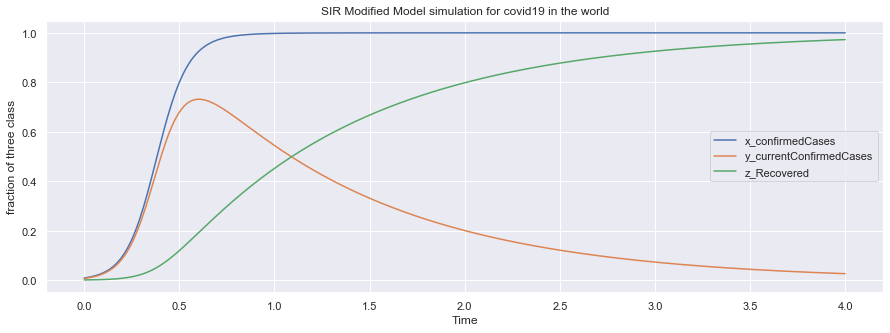

In [47]:
sirModified.plot(x='Time', figsize=(15,5))
plt.ylabel('fraction of three class')
plt.title('SIR Modified Model simulation for covid19 in the world')

In [56]:
obs_conf_world = impute_covid.groupby('ObservationDate')['Confirmed'].aggregate([np.sum]) # confirmed obs
ac_conf_world = impute_covid.groupby('ObservationDate')['active_confirmed'].aggregate([np.sum]) # last upd obs
patient_world_r = impute_covid.groupby('ObservationDate')['Recovered'].aggregate([np.sum]) # lifetime 
patient_world_dea = impute_covid.groupby('ObservationDate')['Deaths'].aggregate([np.sum]) # lifetime 

obs_conf_world.columns = ['Confirmed']
ac_conf_world.columns = ['active_confirmed']
patient_world_r.columns = ['Recovered'] 
patient_world_dea.columns = ['Deaths'] 

Text(0.5, 1.0, 'real curve of covid19 in the world')

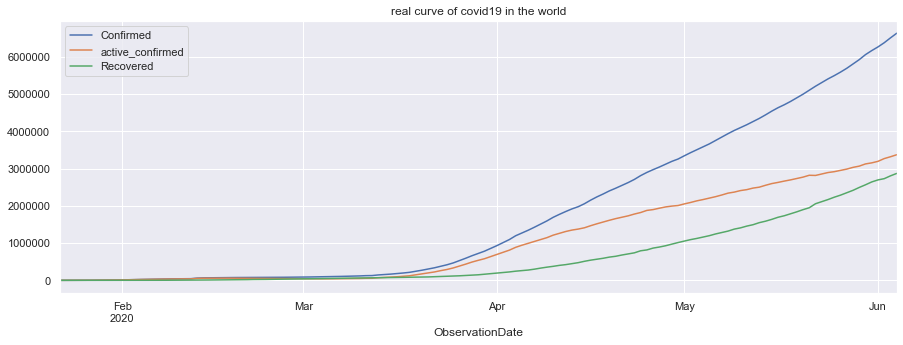

In [57]:
ax = obs_conf_world.plot(figsize=(15,5), legend = True)
ac_conf_world.plot(ax=ax, legend=True)
patient_world_r.plot(ax=ax, legend = True)
plt.title('real curve of covid19 in the world')

On ne peut pas conclure concernant le monde entier car on est encore dans la phase exponentielle. On n'a pas encore obtenir d active_confirmed/dt<0 ;∀t∈[0,inf[ 

On va essayer de comparer le modele ARIMA avec l'évolution du covid en Tunisie

In [58]:
Tunisia = impute_covid[impute_covid['Country/Region'] == 'Tunisia']

In [59]:
conf_Tunisia = Tunisia.groupby('ObservationDate')['Confirmed'].agg('sum')
rec_Tunisia = Tunisia.groupby('ObservationDate')['Recovered'].agg('sum')
dea_Tunisia = Tunisia.groupby('ObservationDate')['Deaths'].agg('sum')
ac_Tunisia = Tunisia.groupby('ObservationDate')['active_confirmed'].agg('sum')

Text(0.5, 1.0, 'real curve of covid19 in Tunisia')

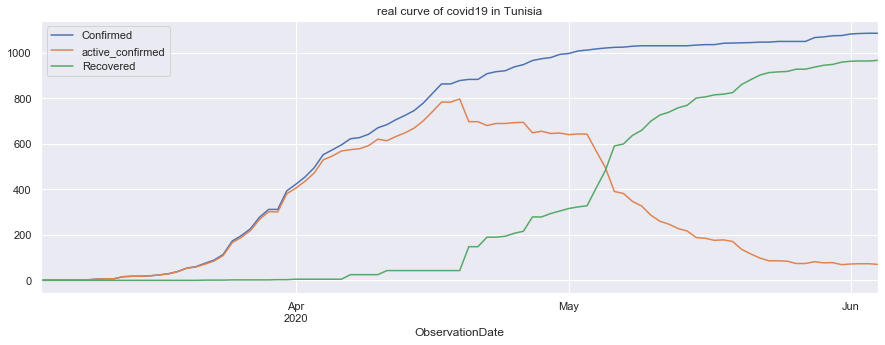

In [60]:
ax = conf_Tunisia.plot(figsize=(15,5), legend = True)
ac_Tunisia.plot(ax=ax, legend=True)
rec_Tunisia.plot(ax=ax, legend = True)
plt.title('real curve of covid19 in Tunisia')

On peut utiliser le modéle SIR pour prédir aproximativement l'évolution de covid en Tunisie et prédir la fin de ce virus en Tunisie

Text(0.5, 1.0, 'phase plane real')

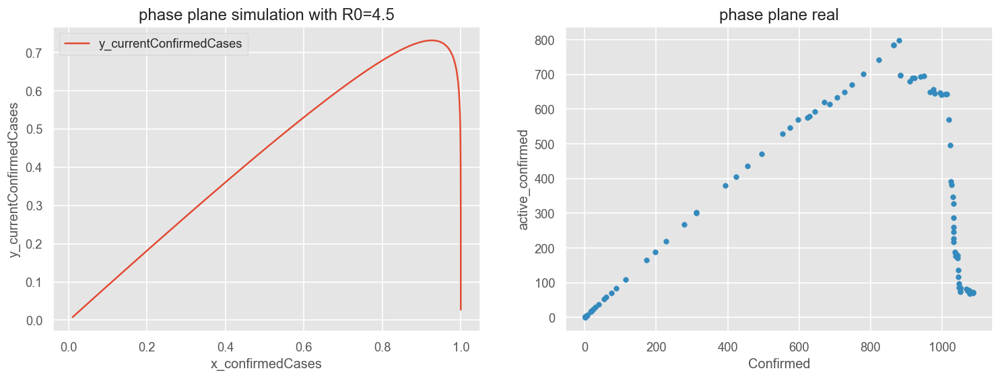

In [223]:
fig = plt.figure(figsize=(15,5))
fig.subplots_adjust(hspace=0.4, wspace=0.2)
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
sirModified.plot(x='x_confirmedCases', y='y_currentConfirmedCases', ax = ax1)
ax1.set_ylabel('y_currentConfirmedCases')
ax1.set_title('phase plane simulation with R0=4.5')

Tunisia.plot(kind='scatter', x='Confirmed', y='active_confirmed', ax=ax2)
ax2.set_title('phase plane real')

Text(0.5, 1.0, 'phase plane real')

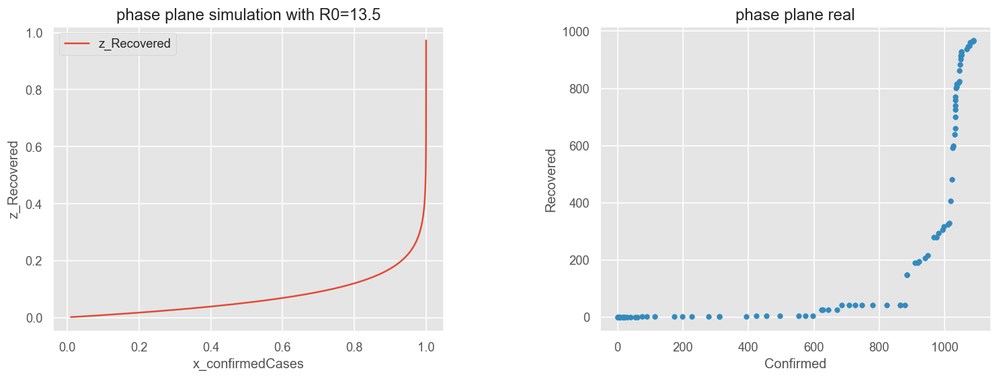

In [224]:
figo = plt.figure(figsize=(15,5))
figo.subplots_adjust(hspace=0.4, wspace=0.4)
axo1 = figo.add_subplot(1,2,1)
axo2 = figo.add_subplot(1,2,2)
sirModified.plot(x='x_confirmedCases', y='z_Recovered', ax = axo1)
axo1.set_ylabel('z_Recovered')
axo1.set_title('phase plane simulation with R0={}'.format(R0))

Tunisia.plot(kind='scatter', x='Confirmed', y='Recovered', ax=axo2)
axo2.set_title('phase plane real')

Text(0.5, 1.0, 'phase plane real')

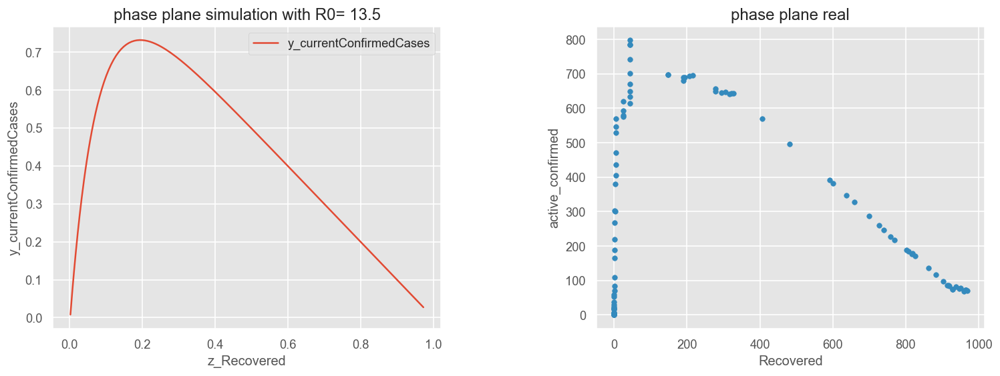

In [225]:
figu = plt.figure(figsize=(15,5))
figu.subplots_adjust(hspace=0.4, wspace=0.4)
axu1 = figu.add_subplot(1,2,1)
axu2 = figu.add_subplot(1,2,2)
sirModified.plot(y='y_currentConfirmedCases', x='z_Recovered', ax = axu1)
axu1.set_ylabel('y_currentConfirmedCases')
axu1.set_title('phase plane simulation with R0= {}'.format(R0))

Tunisia.plot(kind='scatter', y='active_confirmed', x='Recovered', ax=axu2)
axu2.set_title('phase plane real')

We see that SIR modified Model can as well explain the covid19 control in Tunisia

# cas de la Tunisie

### Classement de la Tunisie parmis les pays affectés

In [30]:
world_table = world.reset_index()

In [39]:
x = world_table[world_table['Country/Region'] == 'Tunisia']
big_T = world_table[world_table['Confirmed'] >= x.iloc[0,1]]

In [40]:
big_T['Country/Region'].count()

115

Il y a 114 pays plus affécté que la Tunisie selon le nombre des cas confirmés

La Tunisie est classée 115ème selon les données jusqu'a 04/05/2020

In [41]:
big_T['Country/Region']

0             US
1         Brazil
2         Russia
3             UK
4          Spain
         ...    
110       Kosovo
111    Nicaragua
112    Hong Kong
113       Zambia
114      Tunisia
Name: Country/Region, Length: 115, dtype: object

## Time
### Special Tunisa

In [127]:
Tunisia = impute_covid[impute_covid['Country/Region'] == 'Tunisia']

In [128]:
Tunisia.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,active_confirmed
3375,3376,2020-03-04,missing_value,Tunisia,2020-03-04 01:33:07,1.0,0.0,0.0,1.0
3543,3544,2020-03-05,missing_value,Tunisia,2020-03-04 01:33:07,1.0,0.0,0.0,1.0
3732,3733,2020-03-06,missing_value,Tunisia,2020-03-04 01:33:07,1.0,0.0,0.0,1.0
3947,3948,2020-03-07,missing_value,Tunisia,2020-03-04 01:33:07,1.0,0.0,0.0,1.0
4148,4149,2020-03-08,missing_value,Tunisia,2020-03-08 21:13:10,2.0,0.0,0.0,2.0


In [129]:
Tunisia.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 93 entries, 3375 to 34697
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   SNo               93 non-null     object        
 1   ObservationDate   93 non-null     datetime64[ns]
 2   Province/State    93 non-null     object        
 3   Country/Region    93 non-null     object        
 4   Last Update       93 non-null     datetime64[ns]
 5   Confirmed         93 non-null     float64       
 6   Deaths            93 non-null     float64       
 7   Recovered         93 non-null     float64       
 8   active_confirmed  93 non-null     float64       
dtypes: datetime64[ns](2), float64(4), object(3)
memory usage: 7.3+ KB


In [130]:
Tunistar_date = Tunisia.ObservationDate.min()
Tunisend_date = Tunisia.ObservationDate.max()

In [131]:
print('Novel covid-19 China:\n start date = {}\n end date = {}'.format(Tunistar_date, Tunisend_date))

Novel covid-19 China:
 start date = 2020-03-04 00:00:00
 end date = 2020-06-04 00:00:00


De 04 Mars 2020 à 04 juin 2020

In [132]:
# Récuperer les données les plus récente de la Tunisie
lastTunisia = Tunisia[Tunisia['ObservationDate'] == Tunisend_date]
lastTunisia

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,active_confirmed
34697,34698,2020-06-04,missing_value,Tunisia,2020-06-05 02:33:06,1087.0,49.0,968.0,70.0


In [133]:
print('================ Tunisia report ===================================')
print('== Information to {} on novel COVID-19 =========\n'.format(Tunisend_date))
print('Tota confirmed: {}\nTotal Deaths: {}\nTotal Recovered: {}\nTotal active confirmed: {}\n'.format(\
lastTunisia.Confirmed.sum(), lastTunisia.Deaths.sum(), lastTunisia.Recovered.sum(), lastTunisia.active_confirmed.sum()))
print('==================================================================')

================ Tunisia report ===================================
== Information to 2020-06-04 00:00:00 on novel COVID-19 =========

Tota confirmed: 1087.0
Total Deaths: 49.0
Total Recovered: 968.0
Total active confirmed: 70.0



In [134]:
conf_Tunisia = Tunisia.groupby('ObservationDate')['Confirmed'].agg('sum')
rec_Tunisia = Tunisia.groupby('ObservationDate')['Recovered'].agg('sum')
dea_Tunisia = Tunisia.groupby('ObservationDate')['Deaths'].agg('sum')
ac_Tunisia = Tunisia.groupby('ObservationDate')['active_confirmed'].agg('sum')

Text(0, 0.5, 'Total  confirmed Cases')

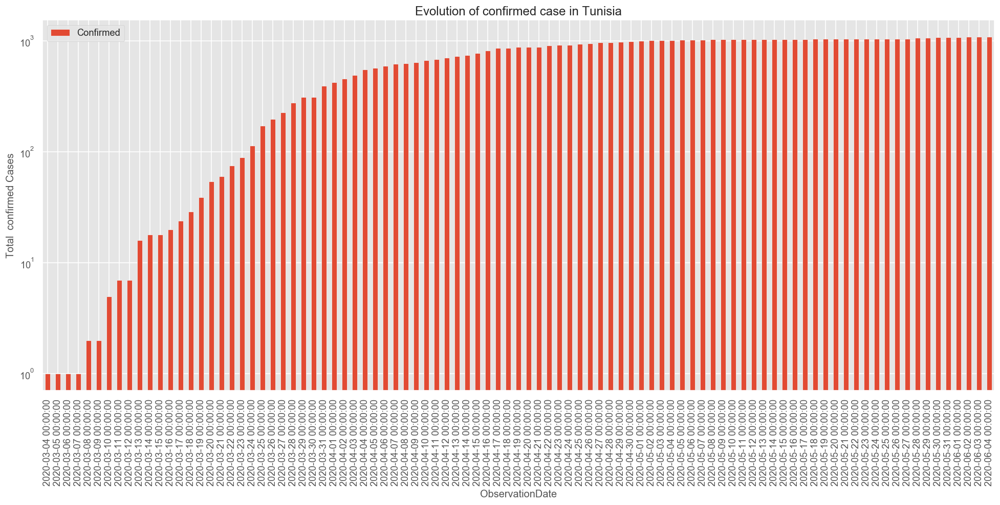

In [135]:
conf_Tunisia.plot(kind='bar', title= 'Evolution of confirmed case in Tunisia', figsize=(20,8), logy=True,\
                           legend=True)
plt.ylabel('Total  confirmed Cases')

Text(0, 0.5, 'Total recovered Cases')

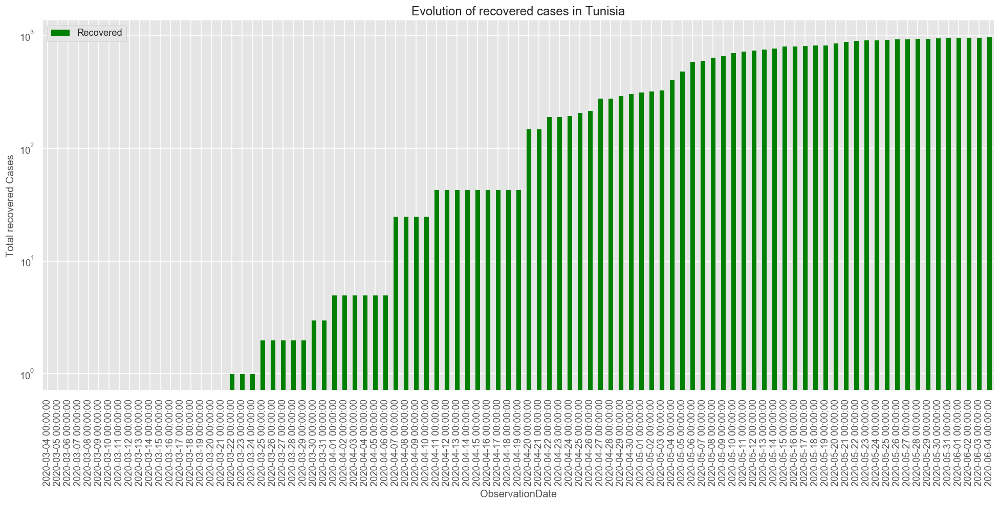

In [136]:
rec_Tunisia.plot(kind='bar', title= 'Evolution of recovered cases in Tunisia', figsize=(20,8), logy=True,\
                           color='green', legend=True)
plt.ylabel('Total recovered Cases')

Text(0, 0.5, 'Total deaths')

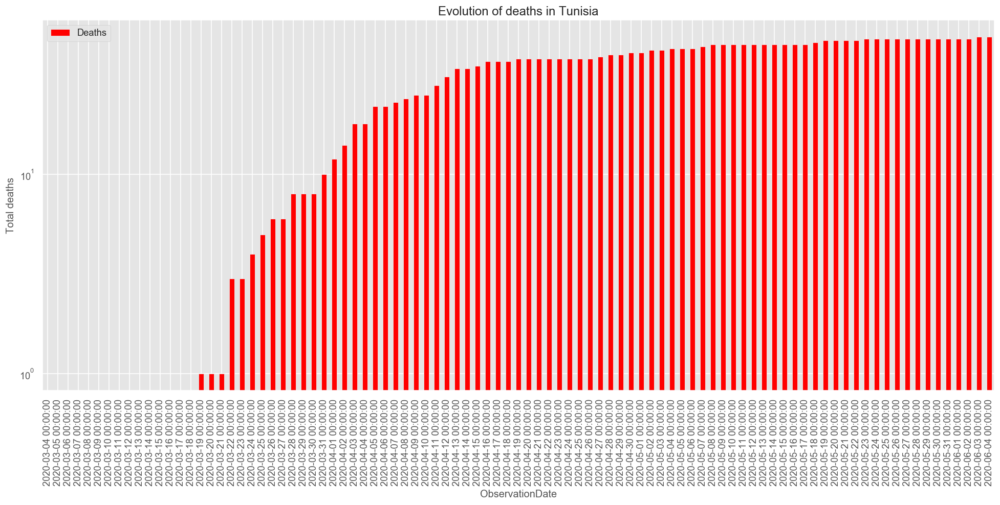

In [137]:
dea_Tunisia.plot(kind='bar', title= 'Evolution of deaths in Tunisia', figsize=(20,8), logy=True,\
                           color='red', legend=True)
plt.ylabel('Total deaths')

Text(0, 0.5, 'Total active_confirmed cases')

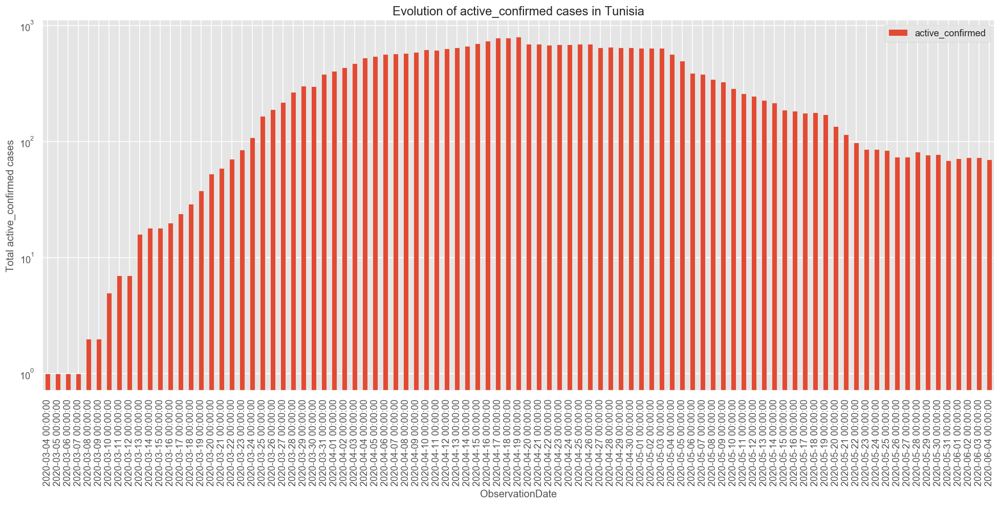

In [138]:
ac_Tunisia.plot(kind='bar', title= 'Evolution of active_confirmed cases in Tunisia', figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Total active_confirmed cases')

A partir de 3 Mai 2020, on observe une decroissance de nombres d'active_confirmed

### The Rest Of the World

In [139]:
rest_world = impute_covid[impute_covid['Country/Region'] != 'Tunisia']

In [140]:
rest_world.head()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,active_confirmed
0,1,2020-01-22,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
1,2,2020-01-22,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0,14.0
2,3,2020-01-22,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0,6.0
3,4,2020-01-22,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0,1.0
4,5,2020-01-22,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0,0.0


In [141]:
print('Novel covid-19 ROW:\n start date = {}\n end date = {}'.format(rest_world.ObservationDate.min(),\
                    rest_world.ObservationDate.max()))

Novel covid-19 ROW:
 start date = 2020-01-22 00:00:00
 end date = 2020-06-04 00:00:00


In [142]:
ROWstar_date = rest_world.ObservationDate.min()
ROWend_date = rest_world.ObservationDate.max()

In [143]:
# Récuperer les données les plus récentes
row = rest_world[rest_world['ObservationDate'] == rest_world.ObservationDate.max()]

In [144]:
print('================ Rest Of the World report =====================================')
print('== Information to {} on novel COVID-19 =========\n'.format(ROWend_date))
print('Tota confirmed: {}\nTotal Deaths: {}\nTotal Recovered: {}\nTotal active confirmed: {}\n'.format(\
row.Confirmed.sum(), row.Deaths.sum(), row.Recovered.sum(), row.active_confirmed.sum()))
print('==================================================================')

================ Rest Of the World report =====================================
== Information to 2020-06-04 00:00:00 on novel COVID-19 =========

Tota confirmed: 6631898.0
Total Deaths: 391087.0
Total Recovered: 2868995.0
Total active confirmed: 3371816.0



In [145]:
obs_conf_world = rest_world.groupby('ObservationDate')['Confirmed'].aggregate([np.sum]) # confirmed obs
ac_conf_world = rest_world.groupby('ObservationDate')['active_confirmed'].aggregate([np.sum]) # last upd obs
patient_world_r = rest_world.groupby('ObservationDate')['Recovered'].aggregate([np.sum]) # lifetime 
patient_world_dea = rest_world.groupby('ObservationDate')['Deaths'].aggregate([np.sum]) # lifetime 

obs_conf_world.columns = ['Confirmed']
ac_conf_world.columns = ['active_onfirmed']
patient_world_r.columns = ['Recovered'] 
patient_world_dea.columns = ['Deaths'] 

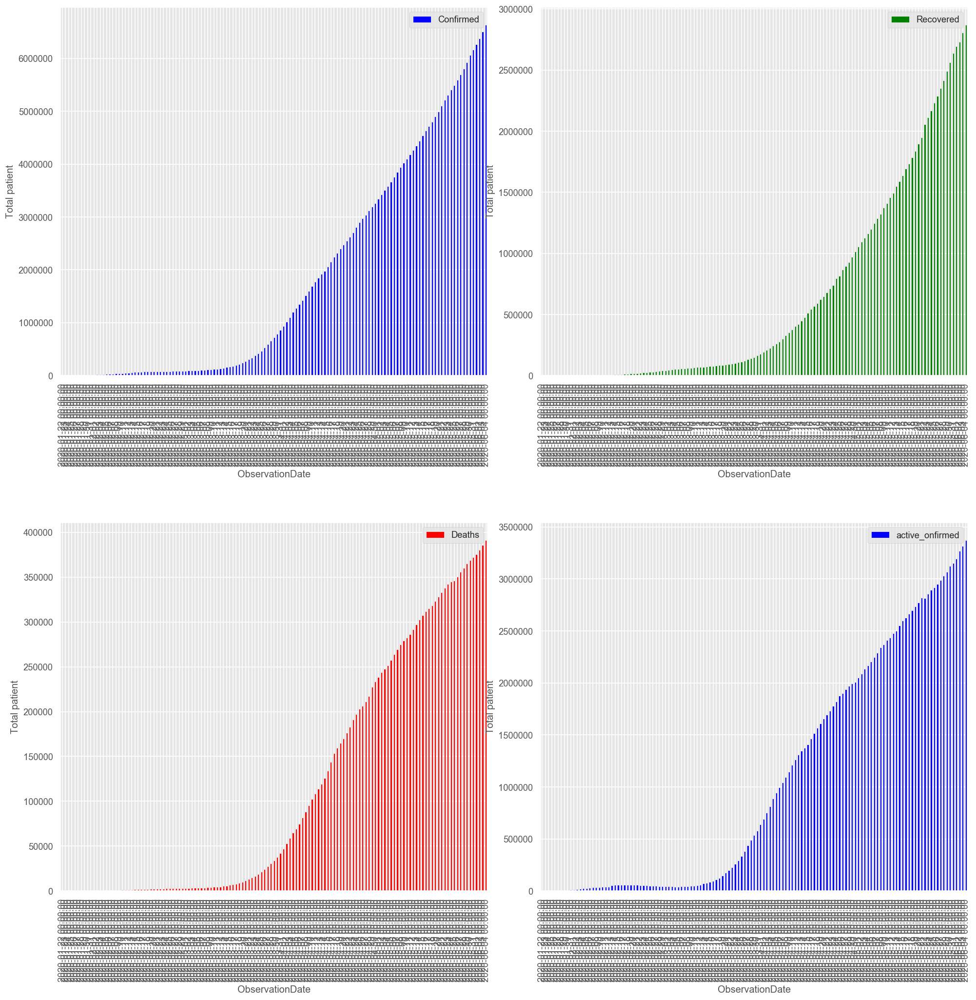

In [146]:
fig = plt.figure(figsize = (20,20))
fig.subplots_adjust(hspace=0.4, wspace=0.125)
dr = [obs_conf_world, patient_world_r, patient_world_dea, ac_conf_world]
color = ['blue', 'green', 'red', 'blue']
for i in range(1, len(dr)+1):
    ax = fig.add_subplot(2,2,i)
    dr[i-1].plot(ax=ax, kind='bar', color = color[i-1], legend=True)
    ax.set_ylabel('Total patient')

### Comparison Tunisia vs Rest Of the World

the goal of this comparison, is to bring out the information hidden in the curves to be able to predict if the end of the covid 19 is closer in Tunisia or closer to the rest of the world.

Text(0, 0.5, 'Total patient')

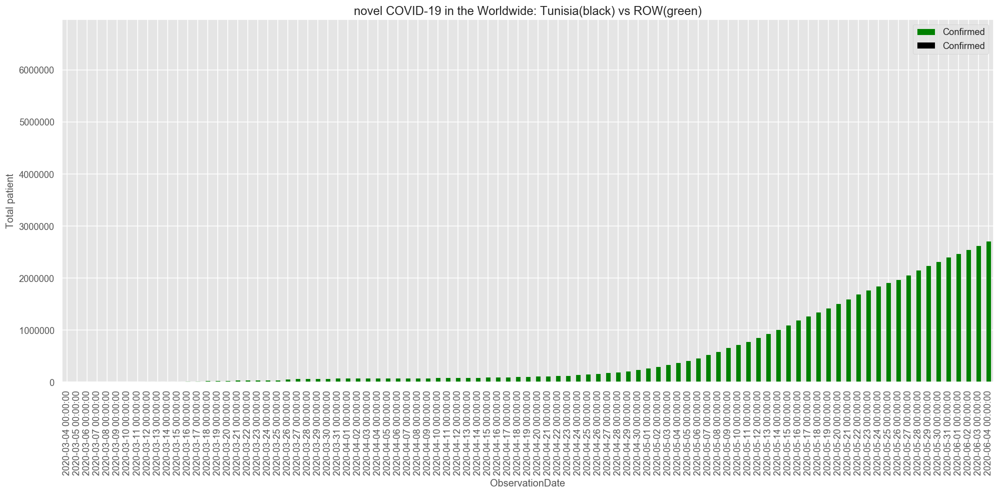

In [147]:
#time_obs.iplot(title='novel COVID-19 in the Worldwide', kind='bar')
time_obs = impute_covid.groupby('ObservationDate')['Confirmed'].aggregate([np.sum])
time_obs.columns = ['Confirmed']
g =time_obs.plot(figsize=(20,8), kind='bar', color='green')
conf_Tunisia.plot(ax=g, kind='bar', color = 'black', legend=True)
plt.title('novel COVID-19 in the Worldwide: Tunisia(black) vs ROW(green)')
plt.ylabel('Total patient')

In [148]:
death_rate = impute_covid.groupby('ObservationDate')['Deaths'].aggregate([np.sum])
recovered_rate = impute_covid.groupby('ObservationDate')['Recovered'].aggregate([np.sum])
activecase_rate = impute_covid.groupby('ObservationDate')['active_confirmed'].aggregate([np.sum])
death_rate.columns = ['Death rate']
recovered_rate.columns = ['Recovered rate']
activecase_rate.columns = ['Active confirmed rate']

Text(0, 0.5, 'Total patient')

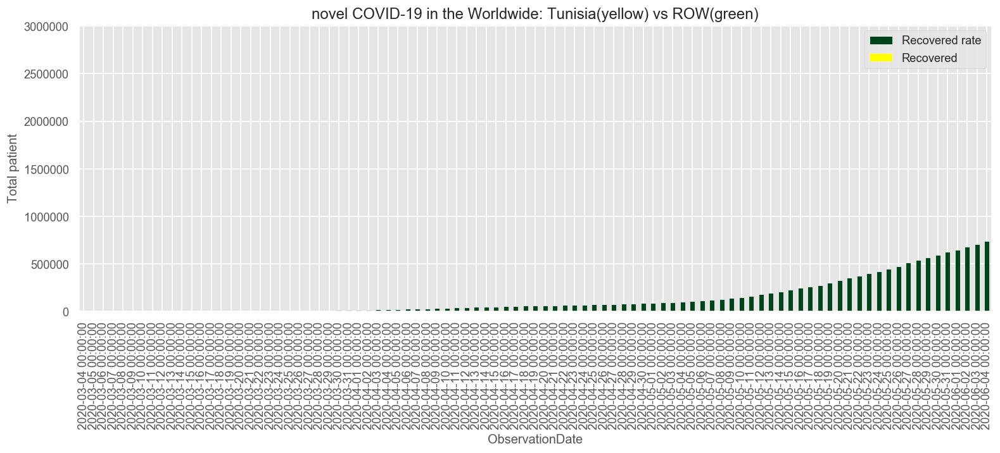

In [149]:
h = recovered_rate.plot(figsize=(15.5, 5), colormap='Greens_r', kind='bar', legend=True) 
rec_Tunisia.plot(ax=h, color='yellow', legend=True, kind='bar')
plt.title('novel COVID-19 in the Worldwide: Tunisia(yellow) vs ROW(green)')
plt.ylabel('Total patient')

Text(0, 0.5, 'Total patient')

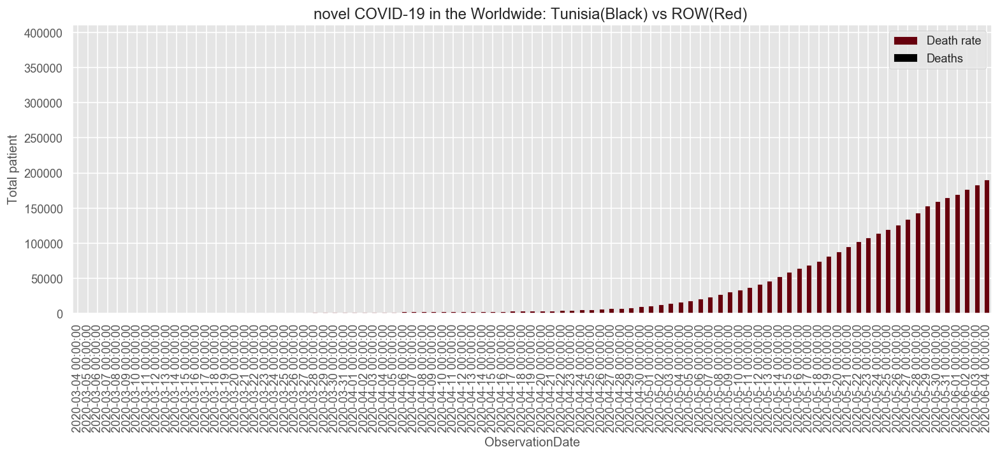

In [150]:
df = death_rate.plot(figsize=(15.5, 5), colormap='Reds_r', kind='bar', legend=True)
dea_Tunisia.plot(ax=df, color='black', kind='bar', legend=True)
plt.title('novel COVID-19 in the Worldwide: Tunisia(Black) vs ROW(Red) ')
plt.ylabel('Total patient')

Text(0, 0.5, 'Total patient')

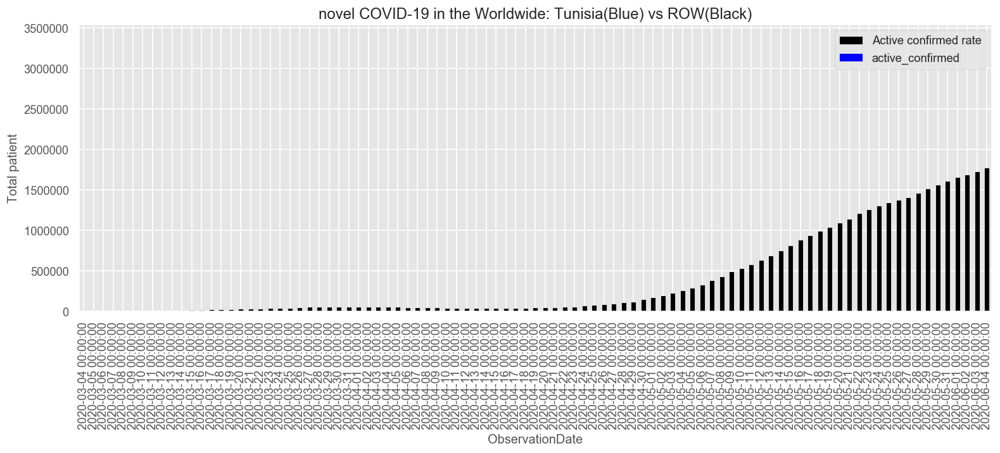

In [151]:
q = activecase_rate.plot(figsize=(15.5, 5),  color='black', kind='bar', legend=True)
ac_Tunisia.plot(kind='bar', color='blue', legend=True, ax=q)
plt.title('novel COVID-19 in the Worldwide: Tunisia(Blue) vs ROW(Black)')
plt.ylabel('Total patient')

The end of covid-19 in Tunisia is coming if another disease does not come

the growth or decline of covid 19 disease will depend on the effectiveness of the policy put in place to combat this disease. So the curve does show us the correlation that exists.

In [152]:
from scipy import stats, linalg

def partial_corr(C):
    """
    Returns the sample linear partial correlation coefficients between pairs of variables in C, controlling 
    for the remaining variables in C.
    Parameters
    ----------
    C : array-like, shape (n, p)
        Array with the different variables. Each column of C is taken as a variable
    Returns
    -------
    P : array-like, shape (p, p)
        P[i, j] contains the partial correlation of C[:, i] and C[:, j] controlling
        for the remaining variables in C.
    """
    
    C = np.asarray(C)
    p = C.shape[1]
    P_corr = np.zeros((p, p), dtype=np.float)
    for i in range(p):
        P_corr[i, i] = 1
        for j in range(i+1, p):
            idx = np.ones(p, dtype=np.bool)
            idx[i] = False
            idx[j] = False
            beta_i = linalg.lstsq(C[:, idx], C[:, j])[0]
            beta_j = linalg.lstsq(C[:, idx], C[:, i])[0]

            res_j = C[:, j] - C[:, idx].dot( beta_i)
            res_i = C[:, i] - C[:, idx].dot(beta_j)

            corr = stats.pearsonr(res_i, res_j)[0]
            P_corr[i, j] = corr
            P_corr[j, i] = corr

    return P_corr

In [153]:
def growth_rate(data=None):
    x = []
    x.append(0)
    for i in range(data.shape[0]-1):
        a = data.iloc[i+1]-data.iloc[i]
        x.append(a/data.iloc[i])
        
    return np.array(x)

In [154]:
def ratio_recovered_death(reco = None, dea = None ):
    """       
        reco is the recovered rate data
        dea is the deaths rate data
    """
    
    x = []
    x.append(0)
    
    if (reco.shape[0] != dea.shape[0]):
        print('ratio is not working. See shape of your data recovered or death')
        
        return None
        
    else:
        
        for j in range(reco.shape[0] - 1):
            
            a = reco.iloc[j+1] - reco.iloc[j]
            b = dea.iloc[j+1] - dea.iloc[j]
            
            c = a/(b+1)
            x.append(c)  
            
    return  np.array(x)

In [155]:
Tunisia['Confirmed'] = pd.to_numeric(Tunisia['Confirmed'], errors='coerce')
Tunisia['Recovered'] = pd.to_numeric(Tunisia['Recovered'], errors='coerce')
Tunisia['Deaths'] = pd.to_numeric(Tunisia['Deaths'], errors='coerce')
Tunisia['active_confirmed'] = pd.to_numeric(Tunisia['active_confirmed'], errors='coerce')

In [156]:
# we define a correlation and partial correlation
Tunisia.corr()

,Confirmed,Deaths,Recovered,active_confirmed
Confirmed,1.000000,0.994055,0.763391,0.404645
Deaths,0.994055,1.000000,0.799976,0.343472
Recovered,0.763391,0.799976,1.000000,-0.281777
active_confirmed,0.404645,0.343472,-0.281777,1.000000


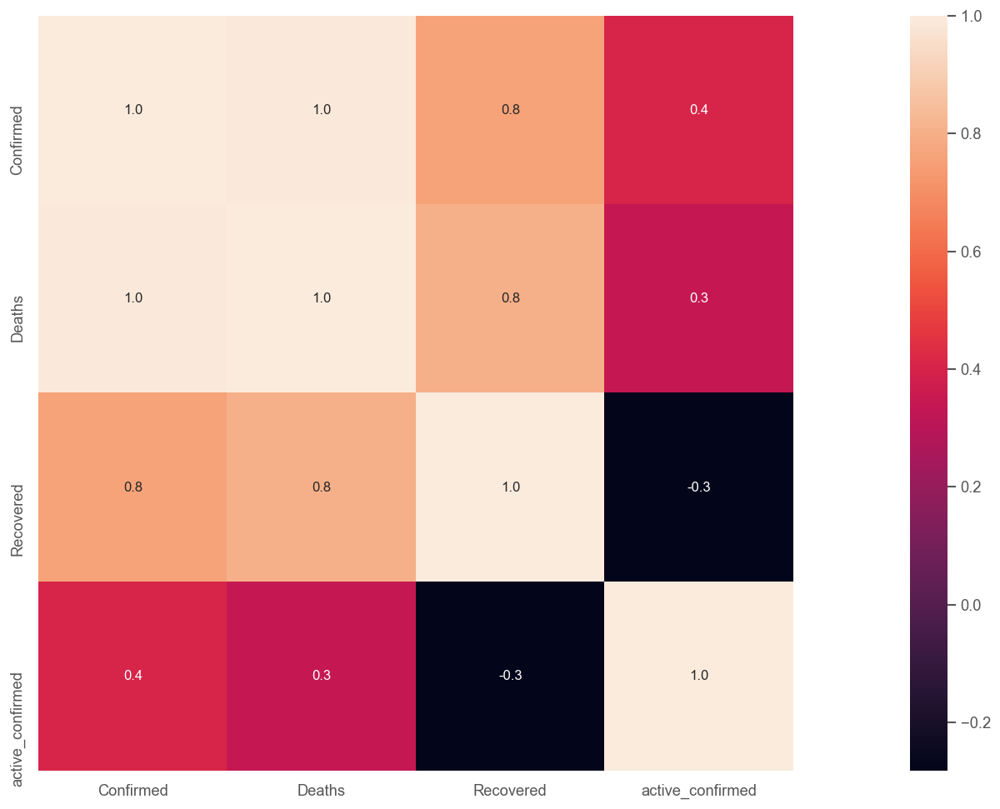

In [157]:
#Matrice de corrélation
corr = Tunisia.iloc[:,1:].corr()
plt.subplots(figsize=(30,10))
sns.heatmap( corr, square=True, annot=True, fmt=".1f" ) 

In [158]:
nT = list(set(Tunisia.columns) - set(['SNo', 'ObservationDate', 'Province/State', 'Country/Region',
       'Last Update']))
pcoray_Tunisia = Tunisia[nT].values 
corrpartial_Tunisia = pd.DataFrame(partial_corr(pcoray_Tunisia), columns=nT, index=nT)
corrpartial_Tunisia.head()

,active_confirmed,Confirmed,Deaths,Recovered
active_confirmed,1.0,1.0,-1.0,-1.0
Confirmed,1.0,1.0,1.0,1.0
Deaths,-1.0,1.0,1.0,-1.0
Recovered,-1.0,1.0,-1.0,1.0


this result tell us that if we take for example deaths and recovered and you fix all other feature, recovered and deaths are more associate between them. And recovered is opposite direction on deaths. we can see a graph.

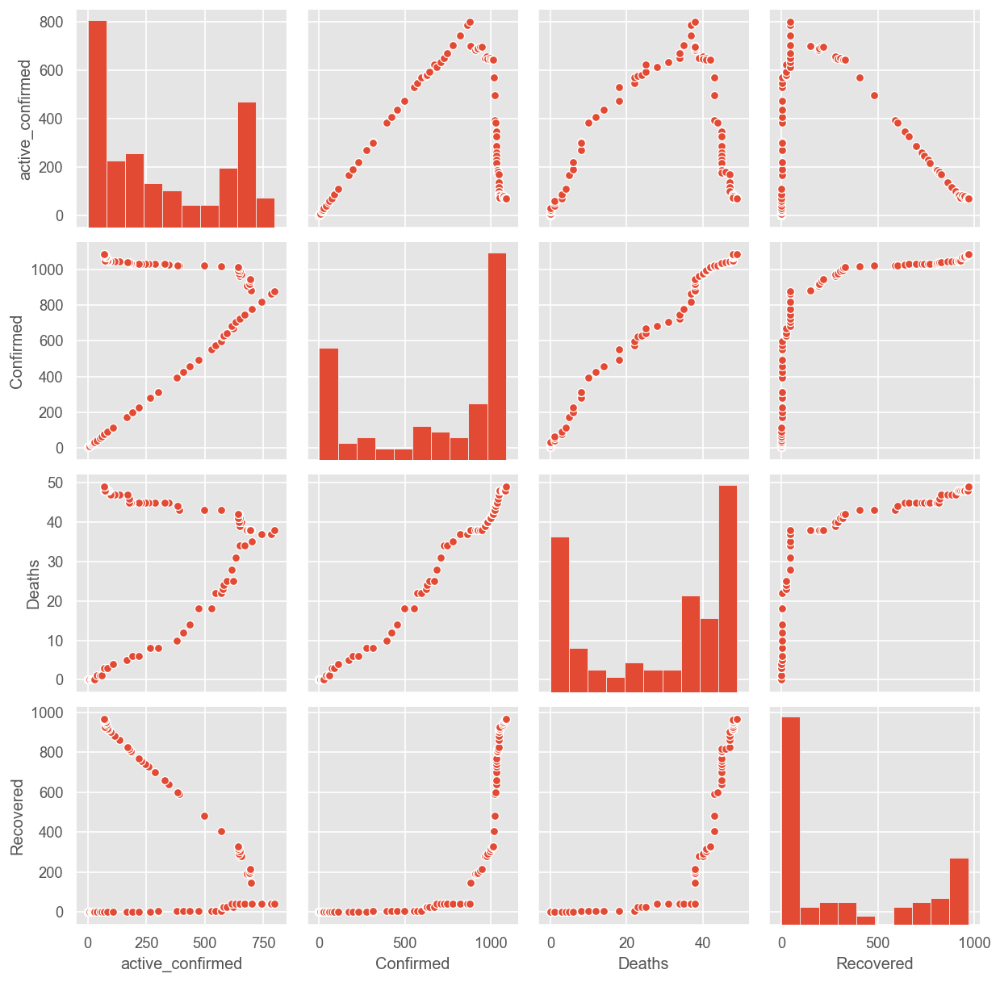

In [159]:
# plot to see
sns.pairplot(Tunisia[nT])

In [160]:
#now we start to compute the ac growth rate and ratio recovered-death in Tunisia
data_Tunisia = Tunisia.groupby('ObservationDate')[['active_confirmed', 'Recovered', 'Deaths']].agg('sum')

In [161]:
ac_growth_rate_Tunisia = growth_rate(data_Tunisia['active_confirmed'])

Text(0, 0.5, 'Growth rate')

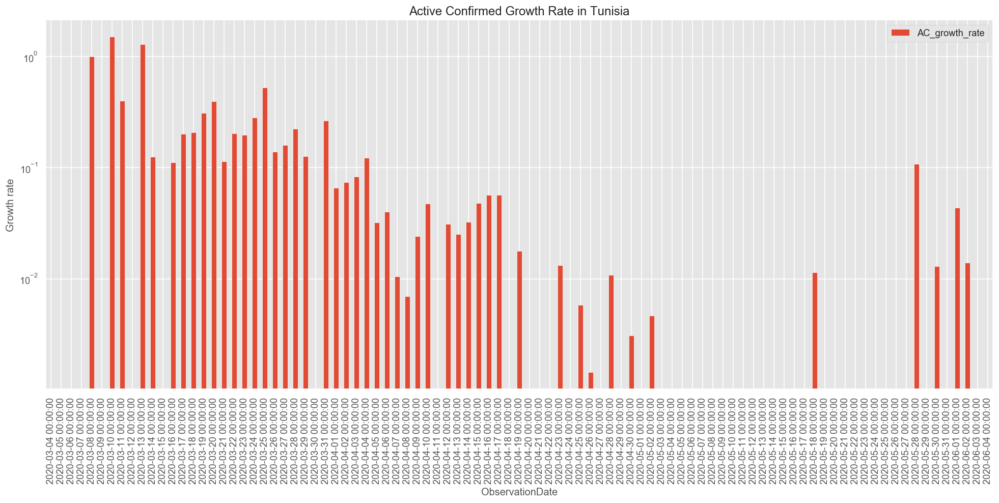

In [162]:
rate_Tunisia = pd.DataFrame(ac_growth_rate_Tunisia, columns=['AC_growth_rate'], index=data_Tunisia.index)
rate_Tunisia.plot(kind='bar', title= 'Active Confirmed Growth Rate in Tunisia', figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Growth rate')

In [163]:
ratio_reco_dea_Tunisia = ratio_recovered_death(data_Tunisia.Recovered, data_Tunisia.Deaths)

Text(0, 0.5, 'ratio recovered death')

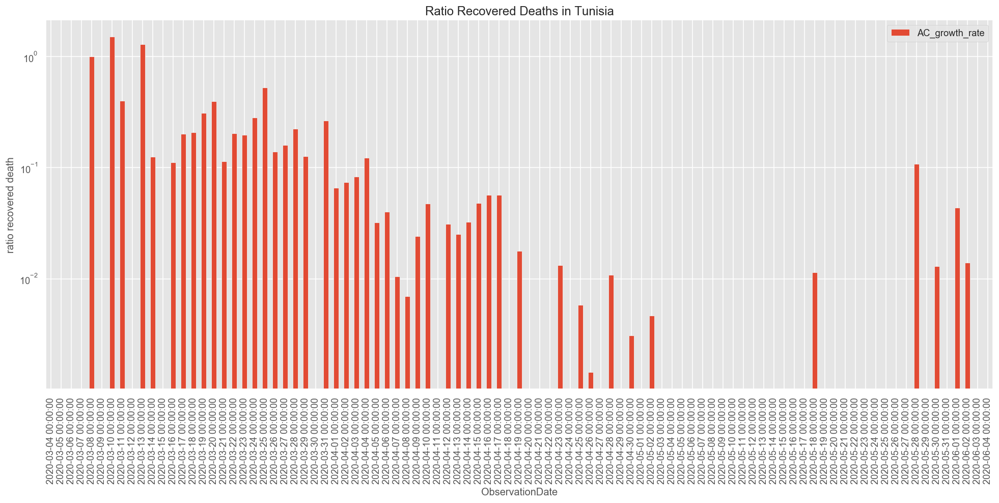

In [164]:
ratio_Tunisia = pd.DataFrame(ratio_reco_dea_Tunisia, columns=['Ratio_recovered_death'], index = data_Tunisia.index)
rate_Tunisia.plot(kind='bar',title= 'Ratio Recovered Deaths in Tunisia', figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('ratio recovered death')

### Seasonality of covid19 in Tunisia

In [165]:
Tunisia['Province/State'].nunique()

1

In [166]:
Tunisia_state = Tunisia.groupby(['Province/State','ObservationDate'])[nT].agg('sum')
Tunisia_observation = Tunisia.groupby('ObservationDate')[nT].agg('sum')

In [167]:
Tunisia_observation.head()

,active_confirmed,Confirmed,Deaths,Recovered
ObservationDate,,,,
2020-03-04,1.0,1.0,0.0,0.0
2020-03-05,1.0,1.0,0.0,0.0
2020-03-06,1.0,1.0,0.0,0.0
2020-03-07,1.0,1.0,0.0,0.0
2020-03-08,2.0,2.0,0.0,0.0


In [168]:
weekly_Tunisia = Tunisia_observation.resample('W').mean()
weekly_Tunisia.head()

,active_confirmed,Confirmed,Deaths,Recovered
ObservationDate,,,,
2020-03-08,1.200000,1.200000,0.000000,0.000000
2020-03-15,10.428571,10.428571,0.000000,0.000000
2020-03-22,42.000000,43.000000,0.857143,0.142857
2020-03-29,191.142857,198.571429,5.714286,1.714286
2020-04-05,439.000000,458.000000,14.571429,4.428571


In [169]:
from statsmodels.tsa import seasonal

In [170]:
decompose_Tunisia = seasonal.seasonal_decompose(Tunisia_observation.Confirmed, model='additive', period=7)

Text(0.5, 0, 'Date')

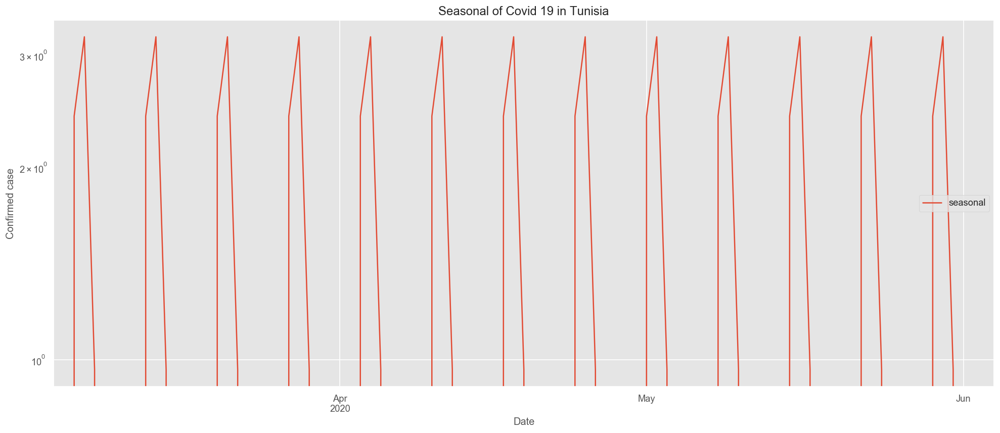

In [171]:
decompose_Tunisia.seasonal.plot(title= 'Seasonal of Covid 19 in Tunisia', figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Confirmed case')
plt.xlabel('Date')

Text(0.5, 0, 'Date')

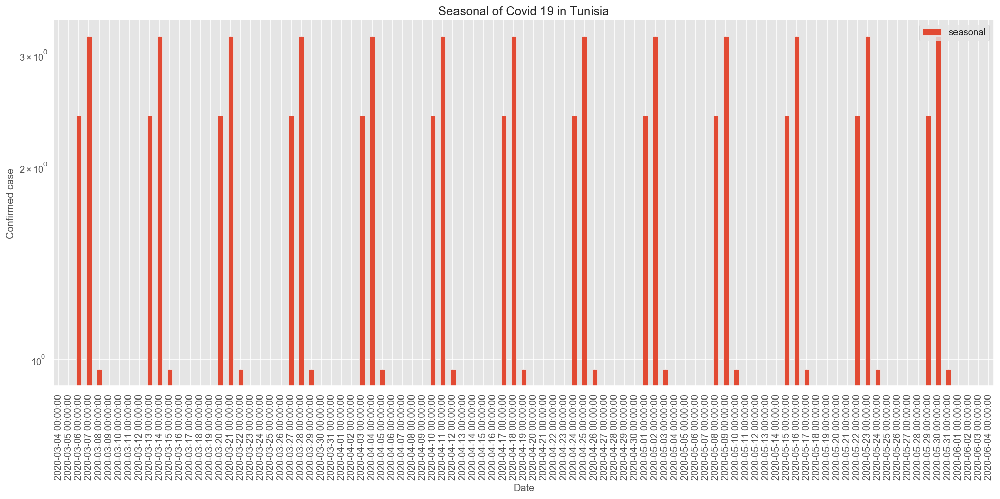

In [172]:
decompose_Tunisia.seasonal.plot(kind='bar',title= 'Seasonal of Covid 19 in Tunisia', figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Confirmed case')
plt.xlabel('Date')

Period 7 days

Text(0.5, 0, 'Date')

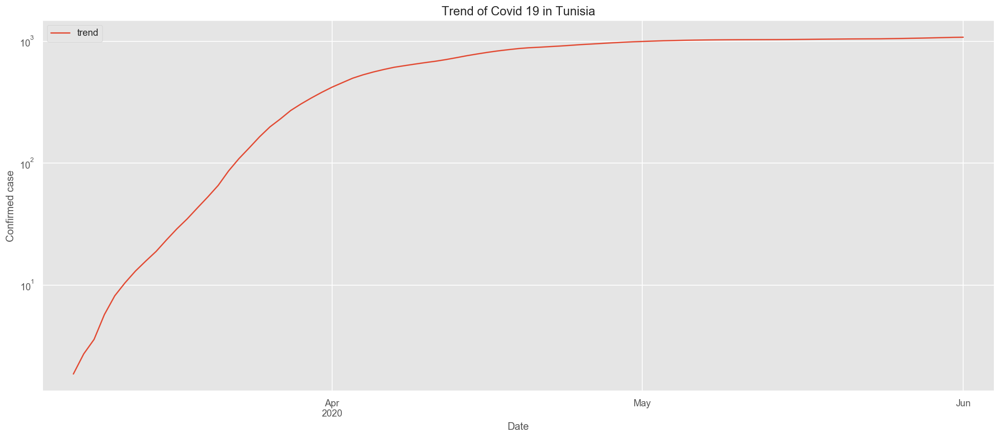

In [173]:
decompose_Tunisia.trend.plot(title= 'Trend of Covid 19 in Tunisia', figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Confirmed case')
plt.xlabel('Date')

### recovered rate, death rate, life increase or decrease in Tunisia

recovered rate is the ratio of the number of people cured over the number of people infected with covid 19.

death rate is the ratio of the number of dead people over the number of people infected with covid 19.

life increase or decrease is the difference between recovered rate and death rate.(increase when is positive and decrease when is negative.)

In [174]:
recovered_rate = Tunisia.Recovered/Tunisia.Confirmed
death_rate = Tunisia.Deaths/Tunisia.Confirmed
life_inc_dec = recovered_rate - death_rate

Text(0, 0.5, 'Recovered rate')

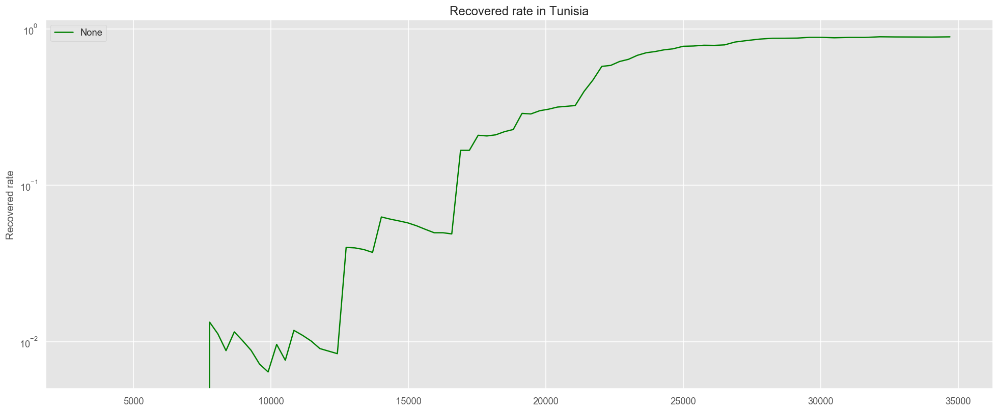

In [175]:
recovered_rate.plot(title='Recovered rate in Tunisia',
                            color='green',figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Recovered rate')

Text(0, 0.5, 'Death rate')

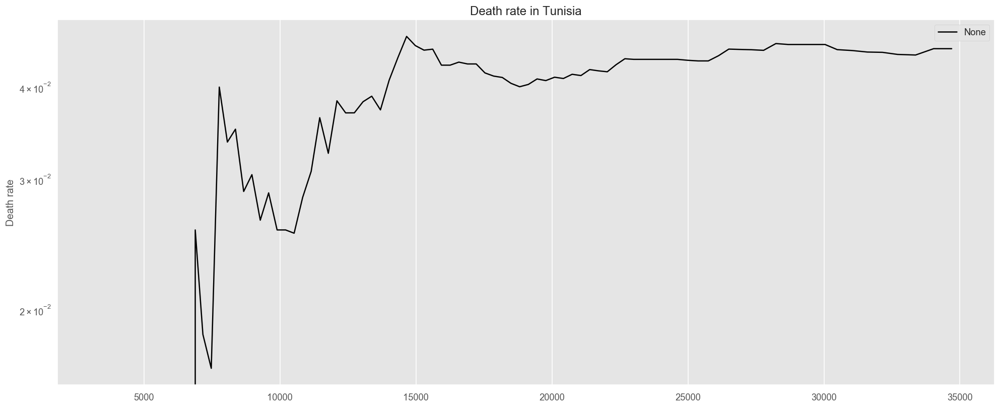

In [176]:
death_rate.plot(title='Death rate in Tunisia',
                            color='black',figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Death rate')

Text(0, 0.5, 'Life')

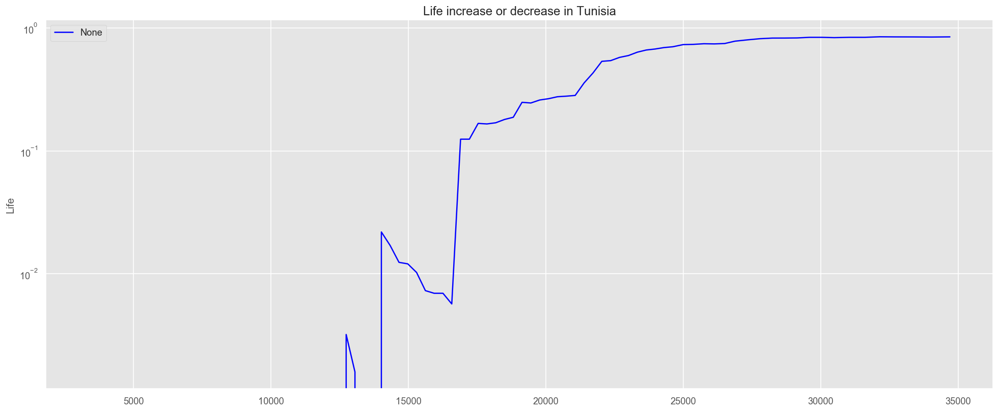

In [177]:
life_inc_dec.plot(title='Life increase or decrease in Tunisia',
                            color='blue',figsize=(20,8), logy=True,\
                            legend=True)
plt.ylabel('Life')